In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library


from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
Student numbers: <span style="color:red"> r0703777, r0708247, r0820817, r0897606, r0878535</span>.

The goal of this assignment is to explore more advanced techniques for constructing features that better describe objects of interest and to perform face recognition using these features. This assignment will be delivered in groups of 5 (either composed by you or randomly assigned by your TA's).

In this assignment you are a group of computer vision experts that have been invited to ECCV 2021 to do a tutorial about  "Feature representations, then and now". To prepare the tutorial you are asked to participate in a kaggle competition and to release a notebook that can be easily studied by the tutorial participants. Your target audience is: (master) students who want to get a first hands-on introduction to the techniques that you apply.

---------------------------------------------------------------
This notebook is structured as follows:
0. Data loading & Preprocessing
1. Feature Representations
2. Evaluation Metrics 
3. Classifiers
4. Experiments
5. Publishing best results
6. Discussion

Make sure that your notebook is **self-contained** and **fully documented**. Walk us through all steps of your code. Treat your notebook as a tutorial for students who need to get a first hands-on introduction to the techniques that you apply. Provide strong arguments for the design choices that you made and what insights you got from your experiments. Make use of the *Group assignment* forum/discussion board on Toledo if you have any questions.

Fill in your student numbers above and get to it! Good luck! 


<div class="alert alert-block alert-info">
<b>NOTE:</b> This notebook is just a example/template, feel free to adjust in any way you please! Just keep things organised and document accordingly!
</div>

<div class="alert alert-block alert-info">
<b>NOTE:</b> Clearly indicate the improvements that you make!!! You can for instance use titles like: <i>3.1. Improvement: Non-linear SVM with RBF Kernel.<i>
</div>
    
---------------------------------------------------------------
# 0. Data loading & Preprocessing

## 0.1. Loading data
The training set is many times smaller than the test set and this might strike you as odd, however, this is close to a real world scenario where your system might be put through daily use! In this session we will try to do the best we can with the data that we've got! 

In [2]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]
  

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

*Note: this dataset is a subset of the* [*VGG face dataset*](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

## 0.2. A first look
Let's have a look at the data columns and class distribution.

In [3]:
# The training set contains an identifier, name, image information and class label
train.head(1)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


In [4]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [5]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images. 

## 0.3. Preprocess data
### 0.3.1 Example: HAAR face detector
In this example we use the [HAAR feature based cascade classifiers](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_objdetect/py_face_detection/py_face_detection.html) to detect faces, then the faces are resized so that they all have the same shape. If there are multiple faces in an image, we only take the first one. 

<div class="alert alert-block alert-info"> <b>NOTE:</b> You can write temporary files to <code>/kaggle/temp/</code> or <code>../../tmp</code>, but they won't be saved outside of the current session
</div>


In [6]:
class HAARPreprocessor():
    """Preprocessing pipeline built around HAAR feature based cascade classifiers. """
    
    def __init__(self, path, face_size):
        self.face_size = face_size
        file_path = os.path.join(path, "haarcascade_frontalface_default.xml")
        if not os.path.exists(file_path): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path)
        
        self.classifier = cv2.CascadeClassifier(file_path)
  
    def download_model(self, path):
        url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
            "haarcascades/haarcascade_frontalface_default.xml"
        
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_faces(self, img):
        """Detect all faces in an image."""
        
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return self.classifier.detectMultiScale(
            img_gray,
            scaleFactor=1.2,
            minNeighbors=5,
            minSize=(30, 30),
            flags=cv2.CASCADE_SCALE_IMAGE
        )
        
    def extract_faces(self, img):
        """Returns all faces (cropped) in an image."""
        
        faces = self.detect_faces(img)

        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]
    
    def preprocess(self, data_row):
        faces = self.extract_faces(data_row['img'])
        
        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img
        
        # only return the first face
        return cv2.resize(faces[0], self.face_size, interpolation = cv2.INTER_AREA)
            
    def __call__(self, data):
        return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)

**Visualise**

Let's plot a few examples.

In [7]:
# parameter to play with 
FACE_SIZE = (100, 100)

def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()
    
def plot_image_sequence_greyscale(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i],cmap='gray')
        else:
            ax[int(i%n)].imshow(data[i],cmap='gray')
    plt.show()

    
#preprocessed data 
preprocessor = HAARPreprocessor(path = '../../tmp', face_size=FACE_SIZE)

train_X, train_y = preprocessor(train), train['class'].values
test_X = preprocessor(test)



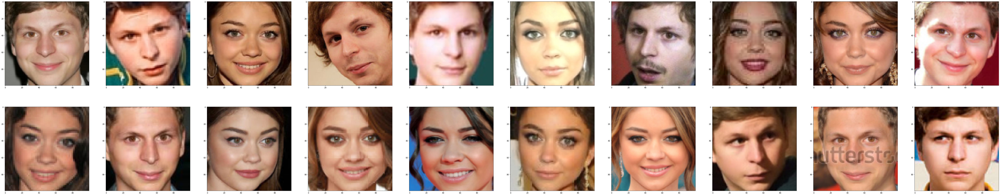

In [8]:
# plot faces of Michael and Sarah

plot_image_sequence(train_X[train_y == 0], n=20, imgs_per_row=10)

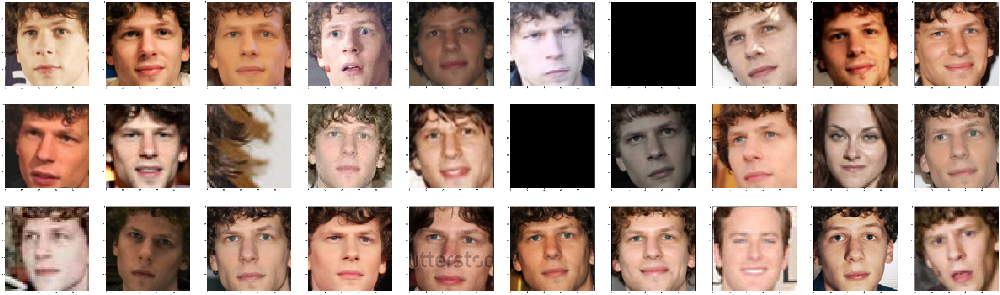

In [9]:
# plot faces of Jesse

plot_image_sequence(train_X[train_y == 1], n=30, imgs_per_row=10)

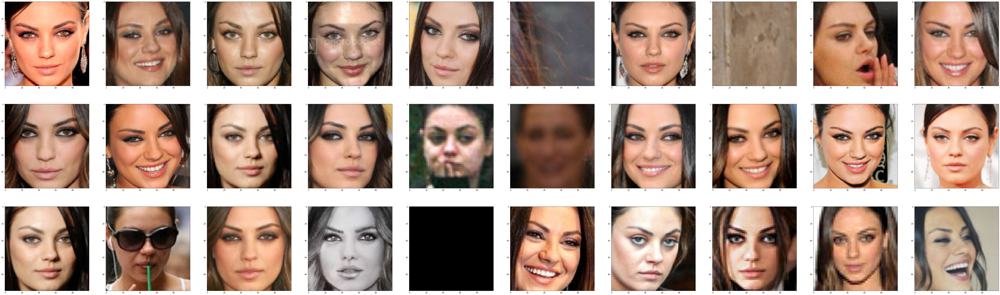

In [10]:
# plot faces of Mila

plot_image_sequence(train_X[train_y == 2], n=30, imgs_per_row=10)

As can be seen from the plots above, there is are some errors present in the test data. Some datapoints are plain black or contain no face. This has to be taken into account when detecting keypoints and the principal components. 

## 0.4. Store Preprocessed data (optional)
<div class="alert alert-block alert-info">
<b>NOTE:</b> You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All". Feel free to use this to store intermediary results.
</div>

In [11]:
# save preprocessed data
prep_path = '/kaggle/working/prepped_data/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
    
np.save(os.path.join(prep_path, 'train_X.npy'), train_X)
np.save(os.path.join(prep_path, 'train_y.npy'), train_y)
np.save(os.path.join(prep_path, 'test_X.npy'), test_X)

# load preprocessed data
prep_path = '/kaggle/working/prepped_data/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
train_X = np.load(os.path.join(prep_path, 'train_X.npy'))
train_y = np.load(os.path.join(prep_path, 'train_y.npy'))
test_X = np.load(os.path.join(prep_path, 'test_X.npy'))

Now we are ready to rock!

# 1. Feature Representations
## 1.0. Example: Identify feature extractor
Our example feature extractor doesn't actually do anything... It just returns the input:
$$
\forall x : f(x) = x.
$$

It does make for a good placeholder and baseclass ;).

In [12]:
class IdentityFeatureExtractor:
    """A simple function that returns the input"""
    
    def transform(self, X):
        return X
    
    def __call__(self, X):
        return self.transform(X)

## 1.1. Baseline 1: HOG feature extractor/Scale Invariant Feature Transform


Now that the faces of the celebrities are detected, we can start extracting handcrafted features, the goal is to use these features to distinguish the different people in the testset. The features or keypoints are points of interest in the image that are characterized by certain local features of the image. Ideally these found features are robust against a change in scale, rotation and illumination, such that the same keypoints are found for the same object in different scenarios/images.

For this we make use of the SIFT feature extractor, the principle goes as follows:

   1.  The image gradient size and direction is calculated for an 8x8 grid
   2.  Out of this 8x8 grid, a 4x4 array of orientation histograms is created, to allow some "slop" in the image
              The gradient contribution to these histograms is dependent on distance to the histogram and distance to the center of the square in the 8x8 grid
   
Each histogram contains 8 orientation bins ( 2 vertical: up-down, 2: horizontal left-right and 4 in a 45 degree angle)
8 orientation bins per cell in a 4x4 array results in a descriptor vector length of (8x4x4) = 128 
When the vectors of one image are found, the distance can be calculated to the vectors of a second image, hereby the vectorpairs which are closest to each other are most likely to describe the same features. To determine the distance, the euclidian distance provides a good similarity measure.



In [13]:
class SIFTFeatureExtractor(IdentityFeatureExtractor):  
           
    def draw_descriptors(self, X, contrast_threshold, edge_threshold,nOctaveLayers,sigma):

        X_gray = X.mean(axis=-1)

        X_gray = X_gray.astype(np.uint8)

        sift = cv2.SIFT_create(contrastThreshold=contrast_threshold, edgeThreshold=edge_threshold,nOctaveLayers = nOctaveLayers,sigma=sigma)
        keypoints, descriptors = sift.detectAndCompute(X_gray, None)

        # Write
        result = None
        result = cv2.drawKeypoints(X_gray, keypoints, result, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)        
        return result
    
    def extract_descriptors(self, X, nfeatures,contrast_threshold, edge_threshold,nOctaveLayers,sigma):

        X_gray = X.mean(axis=-1)

        X_gray = X_gray.astype(np.uint8)

        sift = cv2.SIFT_create(nfeatures=nfeatures,contrastThreshold=contrast_threshold, edgeThreshold=edge_threshold,nOctaveLayers = nOctaveLayers,sigma=sigma)
        keypoints, descriptors = sift.detectAndCompute(X_gray, None)

        # Write
        #result = None
        #result = cv2.drawKeypoints(X_gray, keypoints, result, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)        
        return (keypoints, descriptors)
    
    
    def extract_descriptors_normalized(self, X, nfeatures,contrast_threshold, edge_threshold,nOctaveLayers,sigma):

        X_gray = X.mean(axis=-1)

        X_gray = X_gray.astype(np.uint8)

        sift = cv2.SIFT_create(nfeatures=nfeatures,contrastThreshold=contrast_threshold, edgeThreshold=edge_threshold,nOctaveLayers = nOctaveLayers,sigma=sigma)
        keypoints, descriptors = sift.detectAndCompute(X_gray, None)

        # Write
        #result = None
        #result = cv2.drawKeypoints(X_gray, keypoints, result, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) 
        for i in range(len(descriptors)):
            descriptors[i] = descriptors[i]/np.linalg.norm(np.array(descriptors[i]))
        return (keypoints, descriptors)
    

In [14]:
sift_feature_extractor = SIFTFeatureExtractor()

prep_path = '/kaggle/working/prepped_data/'
train_X = np.load(os.path.join(prep_path, 'train_X.npy'))

contrast1 = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.04, edge_threshold=10,nOctaveLayers=3,sigma=1.6)
contrast2 = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.08, edge_threshold=10,nOctaveLayers=3,sigma=1.6)

edge1  = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.06, edge_threshold=10,nOctaveLayers=3,sigma=1.6)
edge2  = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.06, edge_threshold=20,nOctaveLayers=3,sigma=1.6)


oct1  = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.06, edge_threshold=10,nOctaveLayers=3,sigma=1.6)
oct2  = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.06, edge_threshold=10,nOctaveLayers=6,sigma=1.6)


sigma1  = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.06, edge_threshold=10,nOctaveLayers=3,sigma=0.8)
sigma2  = sift_feature_extractor.draw_descriptors(train_X[0], contrast_threshold=0.06, edge_threshold=10,nOctaveLayers=3,sigma=2.4)


**The four hyperparameters that need to be optimized in the SIFT feature extractor are the following:**

1) Contrast threshold:

    The minimum feature contrast, default value is set to 7.7 using the Lowe parameters [Lowe 2004](https://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf). 
    Increasing this threshold results in extracting fewer but more stable features where a higher change in contrast is found. This can be seen in the two images below where on the left a lower threshold is used, the features that are found in the right image are also present in the left one. However the amount of features is decreased. In our face images, we are looking for features with a decent contrast, such as the eyes, mouth, nose eyebrows etc


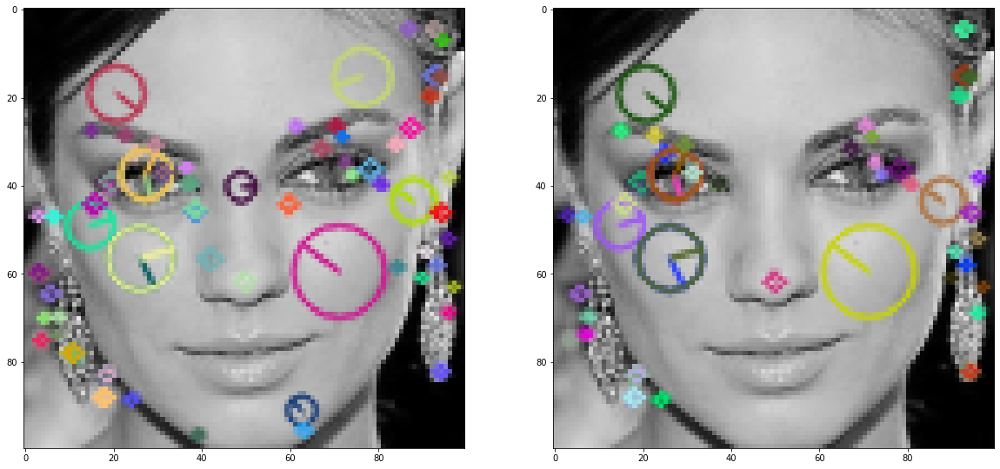

In [15]:
plot_image_sequence([contrast1,contrast2], n=2, imgs_per_row=2)

2) Edge threshold:

    The DoG's will have a strong response along edges, this is also the case when the location along the edge is poorly determined and therefore easily influenced by noise. A poorly defined peak in the DoG function is identified by a large curvature across the edge, but a rather small one in the direction perpendicular to this. The edge threshold can be tuned to eliminate peaks of the Difference of Gaussians scale space whose curvature is too small. This results in an elimination of features that are too elongated. Again it can be seen that the features in the second image are also found in the first one.
    

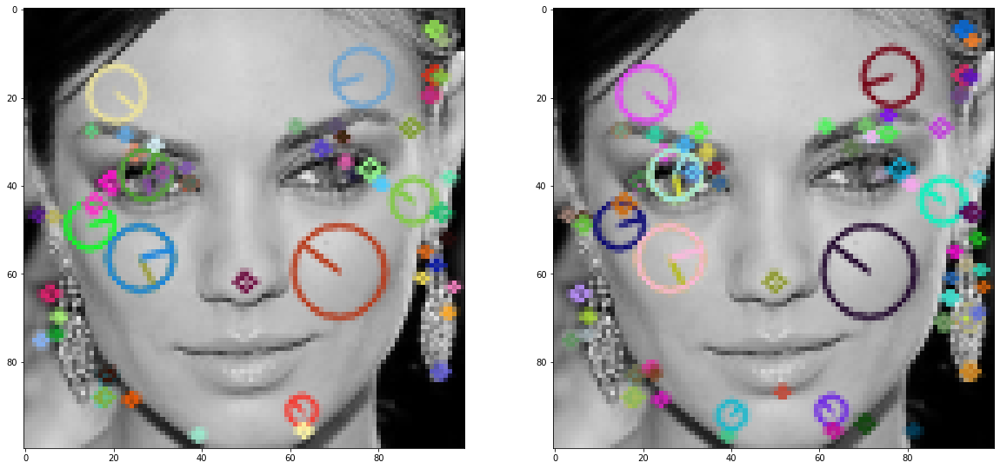

In [16]:
plot_image_sequence([edge1,edge2], n=2, imgs_per_row=2)

3) Number of Octave Layers:

    The number of layers for each octave, the default value is 3. The number of octaves is automatically calculated from the image resolution. The layer k of an octave corresponds to the image after a Gaussian kernel filter has been applied, with a standard deviation of k*sigma. Therefore, the more layers in an octave, the more blurred the image becomes. Using these blurred images, the DoG can be calculated, to detect keypoints. This means that using a higher number of layers in each octave, keypoints are searched on more blurred versions of the image, which results in small variations being blurred out and not detected. This can be seen on the image on the right where less keypoints are detected on the earrings. 


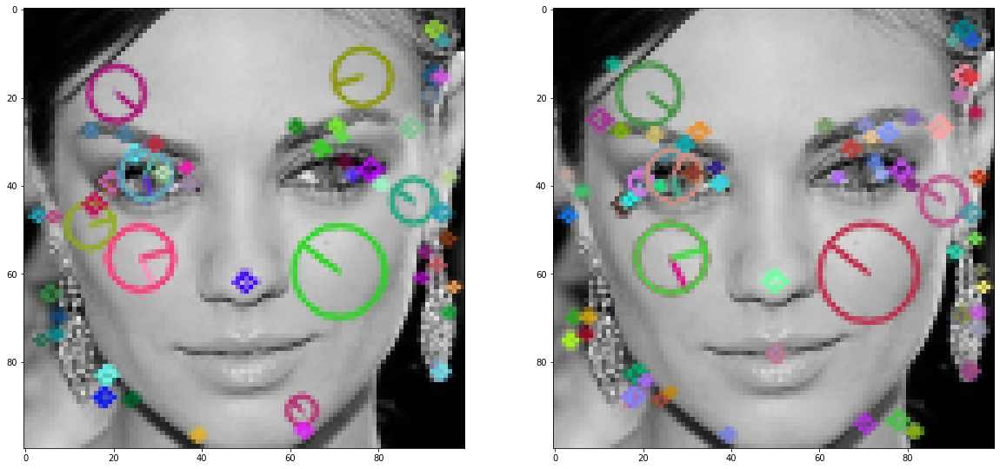

In [17]:
plot_image_sequence([oct1,oct2], n=2, imgs_per_row=2)

4) Sigma:
    
    As previously mentioned, in each octave layer the image is blurred by a Gaussian kernel with standard deviation k*sigma. Increasing the sigma results in a stronger blurring, which moves the focus from details to bigger and more global changes in the image. The default value is 1.6. A change in sigma value does not only influence the amount of keypoints found, but also directly influences how and which keypoints are found. This can be seen on the two images below where some keypoints are shared by both images, whereas others are only present in one of the two results.
             

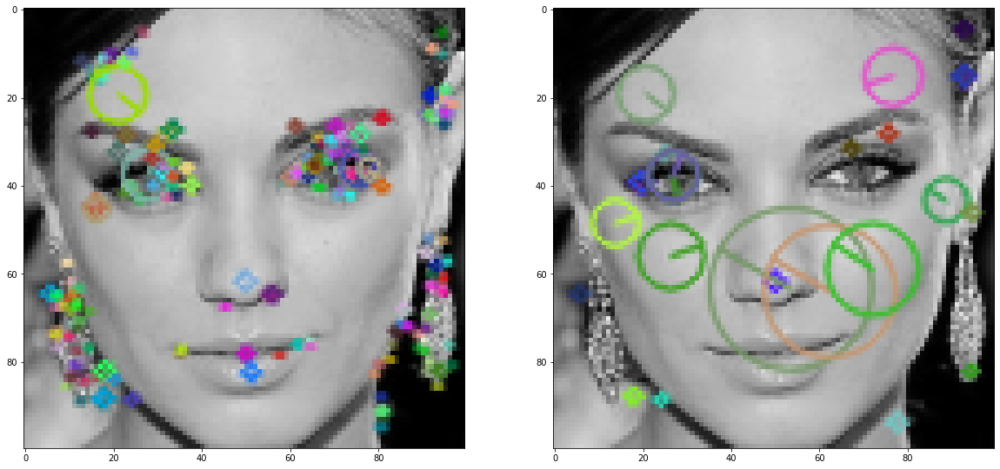

In [18]:
plot_image_sequence([sigma1,sigma2], n=2, imgs_per_row=2)

Now that the meaning and importance of each parameter is known, we can start tuning these to only detect the wanted keypoints that characterize the different people rather than the jewellery or hair they have in a certain image. Different publications (#add references) show that there are no 'golden rules' to automatically tune these parameters for a certain task. The best approach is to try out different parameters and verify what works best.

For our application of recognizing faces we have found that following parameters give the best results:

*         nOctaveLayers = 3
*         contrastThreshold = 0.1
*         edgeThreshold = 30
*         sigma = 0.45
        

The result for 5 images of mila kunis is given below.

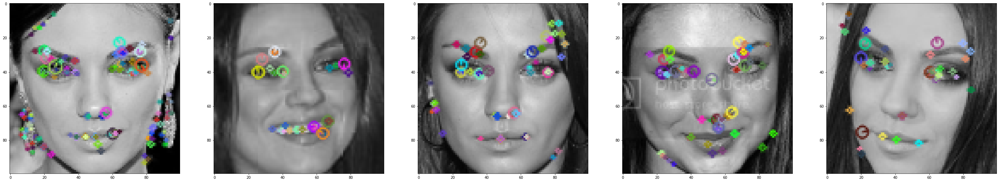

In [19]:

drawnKeypoints = []
for image in train_X[train_y == 2][:5]:
    #generate and draw keypoints
    result = sift_feature_extractor.draw_descriptors(image, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
    drawnKeypoints.append(result)
    
plot_image_sequence(drawnKeypoints, n=5, imgs_per_row=5)    


Reflecting back on the theory of SIFT detection, since the descriptor is based on gradients, which is the change or evolution in pixelintensities, it is invariant to changes in brightness. This can be shown in the following simple example:

original segment [20 20 20 21 22 23 24 25 25 25 25 25 25 26 26 26 30 40 40 40]
brighter segment [70 70 70 71 72 73 74 75 75 75 75 75 75 76 76 76 80 90 90 90]
-----------------------------------------
original gradient [0.  0.  0.5 1.  1.  1.  1.  0.5 0.  0.  0.  0.  0.5 0.5 0.  2.  7.  5.
 0.  0. ]
bright    gradent [0.  0.  0.5 1.  1.  1.  1.  0.5 0.  0.  0.  0.  0.5 0.5 0.  2.  7.  5.
 0.  0. ]


Text(0, 0.5, 'Gradient')

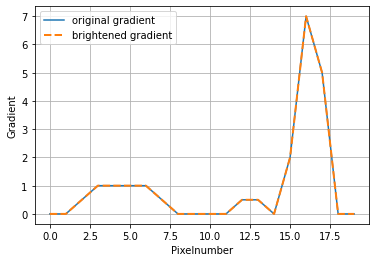

In [20]:
#Suppose we extracted the pixelintensities of a linesegment of a grayscale image, given by the array 'pixel_intensities', the values range from 0 to 255

pixel_intensities = np.array([20,20,20,21,22,23,24,25,25,25,25,25,25,26,26,26,30,40,40,40])

#Now suppose that the exact same linesegment is extracted from the exact same scene, however the illumination conditions have changed, as a result all pixels have
#their intensity equally increased by a value of 50

pixel_intensities_bright = pixel_intensities + 50

print('original segment',pixel_intensities)
print('brighter segment',pixel_intensities_bright)

#we can now calculate the image gradients of the first and second segments

gradient_original = np.gradient(pixel_intensities)
gradient_brighten = np.gradient(pixel_intensities_bright)

print('-----------------------------------------')

#as can be seen the gradients remain unchanged, despite the brightened up image
print('original gradient',gradient_original)
print('bright    gradent',gradient_brighten)



plt.close()
plt.plot(gradient_original,label='original gradient')
plt.plot(gradient_brighten,label='brightened gradient',linestyle='--',linewidth = 2)
plt.grid()
plt.legend(loc='best')
plt.xlabel('Pixelnumber')
plt.ylabel('Gradient')

Unfortunately, the gradients are not invariant to a change in contrast, as a higher contrast increases the magnitude of the gradients linearly. In order to compensate for this the vectors need to be normalized, such that all vectors have a length of 1. 

In [21]:
#code to convert an image to greyscale, will be used later
def gray(image):
    image = np.array(image,dtype=np.uint8)
    grayimg = image.mean(axis=-1)
    grayimg = grayimg.astype(np.uint8)
    return grayimg

Descriptor amount of components: 128
Descriptor vector length: 511.3805


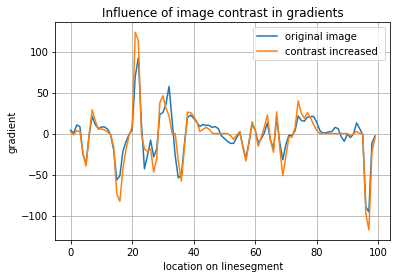

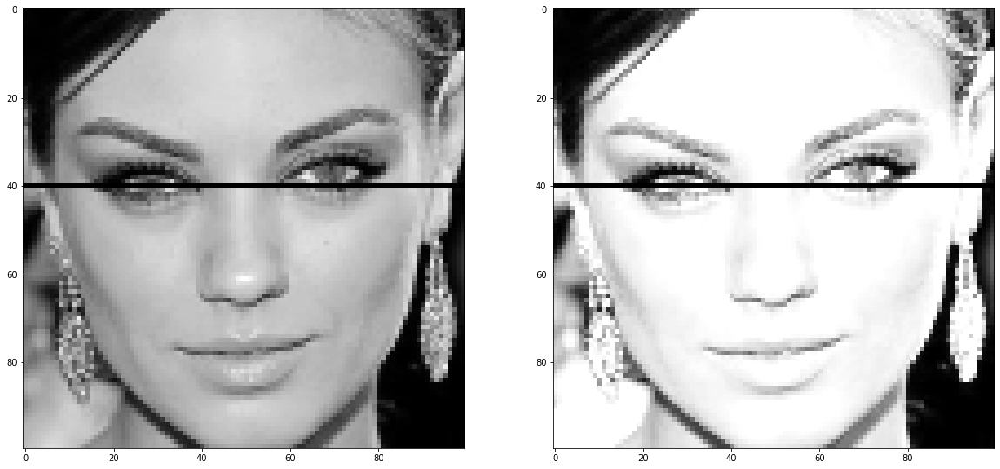

In [22]:
#We check if this normalization is already done by the SIFT algorithm or not

#load training image
image = train_X[0]

#detect keypoints and descriptors
kp, des = sift_feature_extractor.extract_descriptors(image, nfeatures = 100, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)

#get the first descriptor
descriptor = des[0]

#verify the amount of components in the descriptor, each value corresponds to an orientation bin, the amount should be equal to 128 
print('Descriptor amount of components:', len(descriptor))

#check the length of the descriptor
magnitude = np.linalg.norm(descriptor)
print('Descriptor vector length:', magnitude)

#as can be verified, this is not yet normalized. To verify the importance we perform the following experiment:
original = train_X[0] #original reference image
contrast_increased  = np.zeros(original.shape, original.dtype)

#we now increase the contrast of the reference image

alpha = 2  #an alpha > 1 will increase contrast
for y in range(image.shape[0]):
    for x in range(image.shape[1]):
        for c in range(image.shape[2]):
            contrast_increased[y,x,c] = np.clip(alpha*image[y,x,c], 0, 255)
            
            
 
original_gray = gray(original)
contrast_gray = gray(contrast_increased)
#next up, we extract a horizontal line segment through the image

from skimage.draw import line       
x0,x1 = 0,original_gray.shape[0]-1
y0 = 40
y1 = y0

r,c = line(x0,y0,x1,y1)
pixels_orig = original_gray[c,r]
pixels_cont = contrast_gray[c,r]

gradient_orig = np.gradient(pixels_orig)
gradient_cont = np.gradient(pixels_cont)

plt.plot(gradient_orig,label='original image')
plt.plot(gradient_cont,label='contrast increased ')
plt.ylabel('gradient')
plt.xlabel('location on linesegment')
plt.grid()
plt.title('Influence of image contrast in gradients')
plt.legend(loc='best')

#draw the line segments on the images 
cv2.line(original_gray, (x0, y0), (x1, y1), (0, 255, 0), thickness=1)
cv2.line(contrast_gray, (x0, y0), (x1, y1), (0, 255, 0), thickness=1)
            
#plotting the results:
plot_image_sequence_greyscale([original_gray,contrast_gray], n=2, imgs_per_row=2)

On the gradient plot it can be seen that a higher constrast results in higher peaks in the gradients.

The black horizontal line visualizes the linesegment that was used for computing the gradients.

In [23]:
# the descriptors can be easily normalized to a unit vector using following function:

descriptor_normalized = descriptor/np.linalg.norm(descriptor)

print('original magnutide', np.linalg.norm(descriptor))
print('normalized magnitude',np.linalg.norm(descriptor_normalized))

# this is now implemented in the sift extractor with the following function:

# extract_descriptors_normalized(self, X, nfeatures,contrast_threshold, edge_threshold,nOctaveLayers,sigma)

original magnutide 511.3805
normalized magnitude 0.99999994


After determining the keypoints of the training set, they can be used to match with the keypoints of a new test image. To visualize this we make use of a brute force match. The brute force matcher is not the most efficient matching algorithm but it is complete. 
The matcher compares the distance between keypoint 1 of the test image to every keypoint found in the training image and keeps the best match, then keypoint 2 of the test image is compared to every keypoint in the training image and so on. 

An alternative matcher that could have been used is the FlannBasedMatcher, this does not try all the possibilities but find an approximate nearest neighbour. (Fast Library for Approximate Nearest Neighbour).
Since time is not a constraint in this example, we use brute force. 

The matcher is called with two arguments:

1. normType: This refers how the distance is calculated, for the SIFT and SURF descriptors there are two preferable choices [https://docs.opencv.org/3.4/d3/da1/classcv_1_1BFMatcher.html] 
    *     NORM_L1: This corresponds to the Manhattan distance between two vectors
    *     NORM_L2: This correseponds to the euclidian distance, this normtype gave slightly better results during experimenting
    
    
2. Crosscheck: Setting this value to True, the classifier will only return pairs (i,j) such that for the i'th descriptor the j'th desciptor is the nearest and vice versa. This produces best results with minimal number of outliers.


The code below shows how this can be done using the built in openCV functions

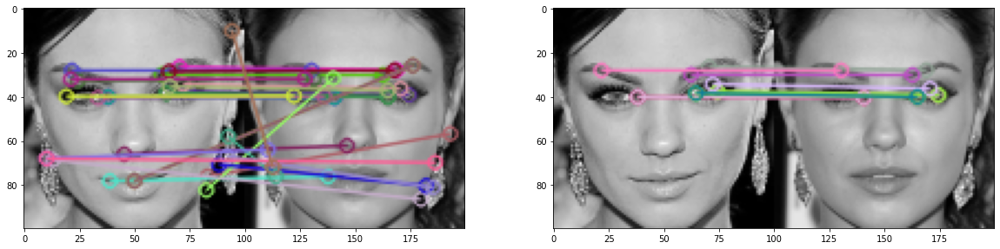

29


In [24]:
sift_feature_extractor = SIFTFeatureExtractor()

image1 = train_X[train_y == 2][0] #the first mila kunis image
image2 = train_X[train_y == 2][6] # the sixth mila kunis image

bruteforceMatch = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

kp1, des1 = sift_feature_extractor.extract_descriptors_normalized(image1, nfeatures = 100, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
kp2 ,des2 = sift_feature_extractor.extract_descriptors_normalized(image2, nfeatures = 100, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)

matches = bruteforceMatch.match(des1, des2)
matches = sorted(matches, key = lambda match: match.distance)


    
match1 = cv2.drawMatches( gray(image1), kp1, gray(image2), kp2, matches, None, flags=2)
match2 = cv2.drawMatches( gray(image1), kp1, gray(image2), kp2, matches[:10], None, flags=2)

plot_image_sequence([match1,match2], n=2,imgs_per_row = 2 )

print(len(matches))


The left image shows all the 29 matches found, however there are some matches that are not related to a real correspondence in features (so called false positive matches), therefore we should prioritize the best matches. The matches are sorted based on their distance, this does not refer to distance in amount of pixels but in terms of how the two vectors of the descriptors are identical.
On the image on the right, only the best 10 matches are shown, here it can be seen that the matches really correspond to the same features. 

We can do the same for two images of Jesse Eisenberg, here we rotate the second image 90 degrees to show the invariance of the SIFT keypoint detection against rotation.

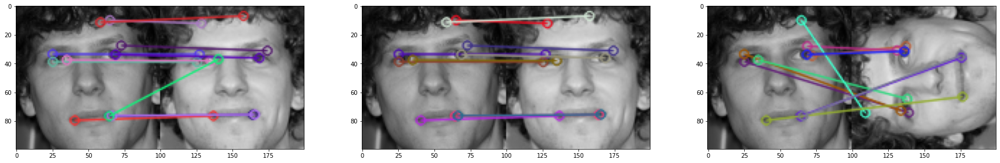

11


In [25]:

image1 = train_X[train_y == 1][25] 
image2 = train_X[train_y == 1][26] 
image3 = np.rot90(image2, k=1, axes=(0, 1))  #rotate the image 90 degrees to show invariance of SIFT against rotation


kp1, des1 = sift_feature_extractor.extract_descriptors_normalized(image1, nfeatures = 100, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
kp2 ,des2 = sift_feature_extractor.extract_descriptors_normalized(image2, nfeatures = 100, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
kp3 ,des3 = sift_feature_extractor.extract_descriptors_normalized(image3, nfeatures = 100, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)

matches = bruteforceMatch.match(des1, des2)
matches = sorted(matches, key = lambda match: match.distance)

matches2 = bruteforceMatch.match(des1, des3)
matches2 = sorted(matches2, key = lambda match: match.distance)
    
match1 = cv2.drawMatches( gray(image1), kp1, gray(image2), kp2, matches, None, flags=2)
match2 = cv2.drawMatches( gray(image1), kp1, gray(image2), kp2, matches[:10], None, flags=2)
match3 = cv2.drawMatches( gray(image1), kp1, gray(image3), kp3, matches2[:10], None, flags=2)

plot_image_sequence([match1,match2,match3], n=3,imgs_per_row = 3)

print(len(matches))

### 1.1.1. t-SNE Plots

The previously defined SIFT feature extractor returns for each image an array of size [nx128] with n the amount of keypoints found. Plotting these descriptors in an 128D-figure would be not interpretable, therefore we simplify this by making use of a t-SNE plot. This is a way of visualizing high dimensional data in a 2D or 3D plot 

In [26]:
#as can be seen in the previous plots, there is some erronous data in the training set, remove this first before starting the t-SNE plot
wrong_indices_jesse = [6,12,15,18,27]
indices = np.linspace(0,29,30)

jesseList = np.array(train_X[train_y==1])
jessefiltered = []
jesseremoved = []

for element in indices:
    element = int(element)
    if element not in wrong_indices_jesse:
        jessefiltered.append(jesseList[element])
    else:
        jesseremoved.append(jesseList[element])
        
        
        
wrong_indices_mila = [5,7,15,24]
milaList = np.array(train_X[train_y==2])
milafiltered = []
milaremoved = []
for element in indices:
    element = int(element)
    if element not in wrong_indices_mila:
        milafiltered.append(milaList[element])
    else:
        milaremoved.append(milaList[element])
        
        
allfaces = np.concatenate((milafiltered,jessefiltered,train_X[train_y==0]))
allfaces_classes = np.concatenate((np.full(len(milafiltered),2),np.full(len(jessefiltered),1),np.full(len(train_X[train_y==0]),0)))
removedimages = np.concatenate((jesseremoved,milaremoved))

The removed images from the training set:

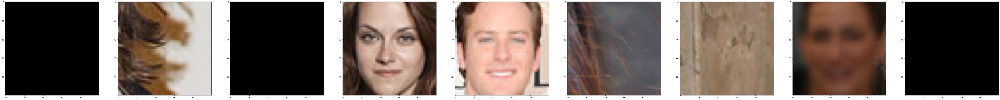

In [27]:
plot_image_sequence(removedimages, n=len(removedimages),imgs_per_row = len(removedimages))

#plot_image_sequence(milafiltered, n=len(milafiltered),imgs_per_row = len(milafiltered))
#plot_image_sequence(jessefiltered, n=len(jessefiltered),imgs_per_row = len(jessefiltered))

#otherfiltered = train_X[train_y==0]
#plot_image_sequence(otherfiltered, n=len(otherfiltered),imgs_per_row = len(otherfiltered))

shortest descriptor length 21


/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


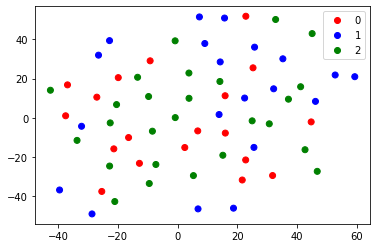

In [28]:
from sklearn.manifold import TSNE
import seaborn as sb
from matplotlib.colors import ListedColormap

#create a SIFT keypointextractor
sift_feature_extractor = SIFTFeatureExtractor()
descriptors = [] #all the descriptors will be stored here
y_values = []    #the corresponding labels will be stored here
tsne_faces = []



for i in range(len(milafiltered)):
    train_X_i = milafiltered[i]
    kp, des = sift_feature_extractor.extract_descriptors_normalized(train_X_i, nfeatures = 200, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
    if des is not None and des.shape[0] > 20:
        descriptors.append(des)
        y_values.append(2)
        tsne_faces.append(train_X_i)
    
for i in range(len(jessefiltered)):
    train_X_i = jessefiltered[i]
    kp, des = sift_feature_extractor.extract_descriptors_normalized(train_X_i, nfeatures = 200, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
    if des is not None and des.shape[0] > 20:
        descriptors.append(des)
        y_values.append(1)
        tsne_faces.append(train_X_i)

for i in range(len( train_X[train_y==0] )):
    train_X_i = train_X[train_y==0][i]
    kp, des = sift_feature_extractor.extract_descriptors_normalized(train_X_i, nfeatures = 200, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
    if des is not None and des.shape[0] > 20:
        descriptors.append(des)
        y_values.append(0)
        tsne_faces.append(train_X_i)
        

#each descriptorvector for img_i is of length [n_i x 128] with n_i the amount of keypoints found
#this vector is only stored in the descriptors list if n_i > 20, this means when at least 20 keypoints are found
#the reason for this is because of the t-SNE plot, in order to transform the high dimensional data of the descriptor of each image, these vectors need to be flattened
#for this, each image needs to have the same amount of descriptors, in order to do this we determine the number of features (n_least) for the image that has the least
#features found, for all other images, we take the top n_least descriptors as an input for the t-SNE plot


descriptors_lengths = map(lambda des: des.shape[0], descriptors) 
descriptors_length_min = min(descriptors_lengths) 
print('shortest descriptor length',descriptors_length_min)

descriptors = list(map(lambda descriptors_i: descriptors_i[:descriptors_length_min, :].flatten(), descriptors))


plt.close()
tsne = TSNE(n_components=2, perplexity=float(15), n_iter=1000, verbose=0).fit_transform(descriptors) # TODO ?

# sb.set(rc={'figure.figsize':(11.7,8.27)})
palette = sb.color_palette("bright", 3)

figure, axes = plt.subplots(1)
labels = ['0', '1', '2']
colors = ListedColormap(['r','b','g'])
scatter = axes.scatter(x=tsne[:,0], y=tsne[:,1], c=y_values, cmap=colors)
axes.legend(handles=scatter.legend_elements()[0], labels=labels)


As can be seen in the t-SNE plot, there are no distinct clusters for each class visible. This is not a good sign because this indicates that the descriptors are not distinctive. It will be hard to correctly classify an unseen image using these SIFT features.
Despite trying out many different parameters we did not find configuration that results in a good t-SNE plot. 

Alot of research is done on the SIFT feature extractor, and multiple studies show that the extractor is not ideal for face recognition, this is because the extractor focuses on areas with sharp edges and high constrast [Xudong Jiang,SIFT features for face recognition]. These properties hold for alot of day to day objects, unfortunately this is not the case for faces, where differences are more subtle. 

Since it is not the case that all the points are randomly distributed, but some smaller clusters of 3-5 datapoints are visible, our keypoints are not nescessarily useless. A possible explanation could be that different poses of the person result in the different clusters visible. For example a cluster of combined Mila datapoints correspond to pictures of her smiling with her teeth visible, while another cluster correspond to pictures of her not smiling at all or without visible teeth. 

When we plot the corresponding faces in the graph below, it can be seen that this is unfortunately not the case.

Text(0.5, 1.0, 't-SNE plot of training faces based on SIFT keypoint descriptors')

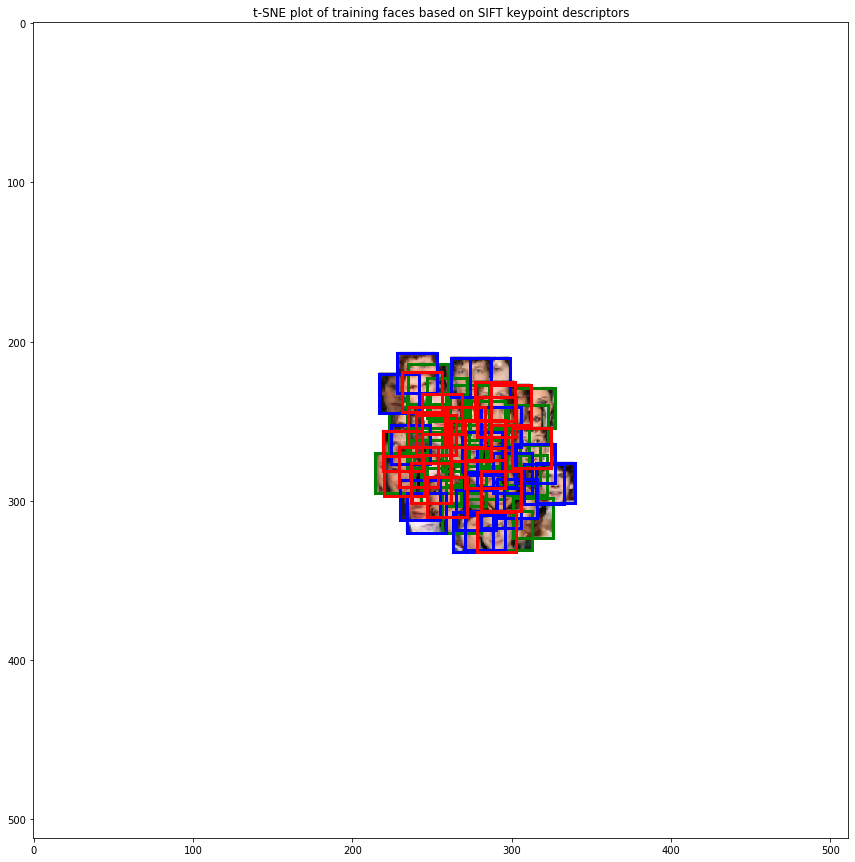

In [29]:
import matplotlib.patches as mpatches
graph = np.full((512, 512),255, dtype=np.uint8)
graph = cv2.cvtColor(graph, cv2.COLOR_BGR2RGB)

tsne_new = (tsne*1).astype('int16')+256

# for each face in the training data: resize it and add it to the graph
rectangles = []
for i in range(tsne.shape[0]):
    h = 25
    w = 25
    train_i = allfaces[i]
    train_i = cv2.resize(train_i,(h,w), interpolation=cv2.INTER_LINEAR_EXACT)
    
    x = int(tsne_new[i][0])
    y = int(tsne_new[i][1])
    
    graph[y:y+h, x:x+w] = train_i

    if y_values[i] == 0:
        color = 'red'
    elif y_values[i] == 1:
        color = 'blue'
    elif y_values[i] == 2:
        color = 'green'
    
    left, bottom, width, height = (x, y, w, h)
    rect=mpatches.Rectangle((left,bottom),height,width, fill=False,color=color,linewidth=3)
    rectangles.append(rect)
    

# plot the resulting graph
plt.figure(figsize=(15,15))
plt.imshow(graph)
for rect in rectangles:
    plt.gca().add_patch(rect)
plt.title('t-SNE plot of training faces based on SIFT keypoint descriptors')

As an alternative, we try the HOG feature extractor to check if these descriptors result in more distinctive descriptors, and therefore better t-SNE plots

In [30]:
class HOGFeatureExtractor(IdentityFeatureExtractor):
    
    def __init__(self, dim): # the standard dim = (64,128)
        self.dim = dim
        
    def transform(self, X):
        X_gray = X.mean(axis=-1)
        im = X_gray.astype(np.uint8)
        im = cv2.resize(im, dim, interpolation = cv2.INTER_AREA) # resize to the dim (standard HOG definition = 64x128)
        
        winSize = (im.shape[1],im.shape[0]) 
        blockSize = (16,16)  
        blockStride = (8,8) 
        cellSize = (8,8) 
        nbins = 9 
        derivAperture = 1
        winSigma = 2. 
        histogramNormType = 0  
        L2HysThreshold = 0.2
        gammaCorrection = 4 
        nlevels = 64 
        hog = cv2.HOGDescriptor(winSize,blockSize,blockStride,cellSize,nbins,derivAperture,winSigma,
                                histogramNormType,L2HysThreshold,gammaCorrection,nlevels)


        hist = hog.compute(im)
            
        return hist

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


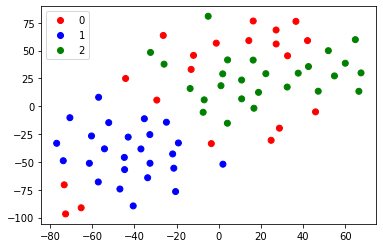

In [31]:
dim = (64,128) # standard image size of HOG feature extractor
HOG = HOGFeatureExtractor(dim)
hist = []
y_values  = []

for i in range(len(milafiltered)): 
    X = milafiltered[i]
    hist.append(HOG.transform(X))
    y_values.append(2)
    
for i in range(len(jessefiltered)): 
    X = jessefiltered[i]
    hist.append(HOG.transform(X))
    y_values.append(1)

for i in range(len(train_X[train_y==0])): 
    X = train_X[train_y==0][i]
    hist.append(HOG.transform(X))
    y_values.append(0)
    

hist_reshaped = np.reshape(hist,(len(hist),len(hist[0])))


plt.close()
tsne = TSNE(n_components=2, perplexity=float(25), n_iter=1000, verbose=0).fit_transform(hist_reshaped) 

# sb.set(rc={'figure.figsize':(11.7,8.27)})
palette = sb.color_palette("bright", 3)

figure, axes = plt.subplots(1)
labels = ['0', '1', '2']
colors = ListedColormap(['r','b','g'])
scatter = axes.scatter(x=tsne[:,0], y=tsne[:,1], c=y_values, cmap=colors)
axes.legend(handles=scatter.legend_elements()[0], labels=labels)

Text(0.5, 1.0, 't-SNE plot of training faces based on SIFT keypoint descriptors')

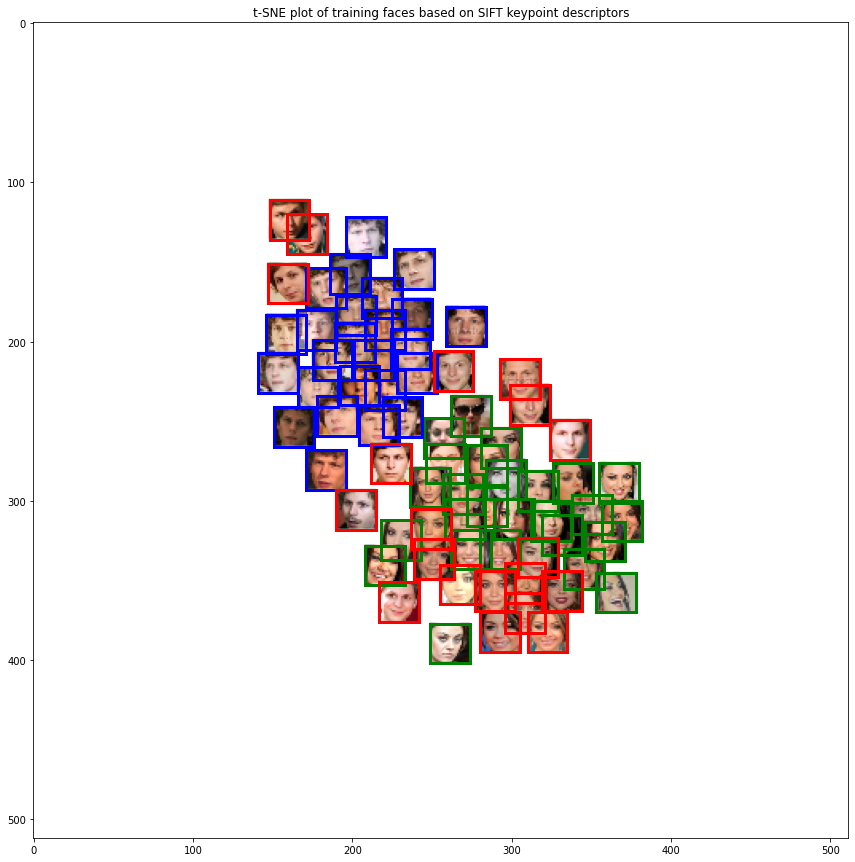

In [32]:

SCALE = 1.5

graph = np.full((512, 512),255, dtype=np.uint8)
graph = cv2.cvtColor(graph, cv2.COLOR_BGR2RGB)

tsne_new = (tsne*SCALE).astype('int16')+256

# for each face in the training data: resize it and add it to the graph
rectangles = []
for i in range(len(allfaces)):
    h = 25
    w = 25
    train_i = allfaces[i]
    train_i = cv2.resize(train_i,(h,w), interpolation=cv2.INTER_LINEAR_EXACT)
    
    x = int(tsne_new[i][0])
    y = int(tsne_new[i][1])
    graph[y:y+h, x:x+w] = train_i
    
    #draw a colored square around the faces to indicate the corresponding classes
    
    if y_values[i] == 0:
        color = 'red'
    elif y_values[i] == 1:
        color = 'blue'
    elif y_values[i] == 2:
        color = 'green'
    
    left, bottom, width, height = (x, y, w, h)
    rect=mpatches.Rectangle((left,bottom),height,width, fill=False,color=color,linewidth=3)
    rectangles.append(rect)
    

# plot the resulting graph
plt.figure(figsize=(15,15))
plt.imshow(graph)
for rect in rectangles:
    plt.gca().add_patch(rect)
plt.title('t-SNE plot of training faces based on SIFT keypoint descriptors')



### IF YOU GET AN ERROR HERE, LOWER THE SCALE PARAMETER ON THE FIRST LINE OF THIS CELL #############

The HOG features result in much better clusters, which should enable a classifier to obtain better results compared to the SIFT features. A possible reason could be that the HOG extractor returns far more keypoints per image, because the amount of features is dependent on the image size. However when we changed the parameters of the SIFT detector to allow more features to be detected, results only became worse.

### 1.1.2. Discussion


By using the SIFT algorithm which is known to be preferred for extracting local features [Jian et al. https://doi.org/10.2478/msr-2013-0021], we were unable to capture correctly all the images of the celebrities, even after performing a sensitivity analysis on the four parameters that were described above. Conversely, by using the HOG algorithm, which is used to extract global features, it has been found to produce more accurate results with regards to the classification of the images.

## 1.2. Baseline 2: PCA feature extractor

Principal component analysis is a statistical method used for dimensionality reduction. It projects each data point on a few principal components to reduce the dimensionality, while preserving as much of the data's variation as possible. In mathematical terms, the principal components correspond to eigenvectors of the covariance matrix of the data.

Here, we will use PCA on image data to extract the most relevant features of human faces. The first few eigenvectors (for face images also called eigenfaces) explain the most variance in the dataset. Each consecutive eigenface explains a bit less variance.

In [33]:
print(train_X.shape)
print(test_X.shape)

(80, 100, 100, 3)
(1816, 100, 100, 3)


The training and test set consist of 80 and 1816 images respectively, all of pixel size 100 x 100.

We first convert our original numpy arrays (both from the training and test set) to grayscale, because the PCA feature extractor expects a two dimensional inputarray. The function make_gray prints the output shape of the converted numpy array. As you can see, the outputs are two dimensional and the second dimension now equals 100x100 = 10000 from the original pixel size of the images.

In [34]:
# convert to grayscale and flatten
def make_gray(train_X):
    gray_train_X = [cv2.cvtColor(i.astype('uint8'), cv2.COLOR_BGR2GRAY) for i in train_X]
    print(len(gray_train_X))
    gray_train_X = np.reshape(np.asarray(gray_train_X),(len(gray_train_X),-1))
    print(gray_train_X.shape)
    return gray_train_X

gray_train_X = make_gray(train_X)
gray_test_X = make_gray(test_X)

np.save(os.path.join(prep_path, 'gray_train_X.npy'), gray_train_X)
np.save(os.path.join(prep_path, 'gray_test_X.npy'), gray_test_X)

80
(80, 10000)
1816
(1816, 10000)


As an illustration, we display the mean, standard deviation and standardized faces alongside our initial training face.

In [35]:
#mean face
mean_face = np.mean(gray_train_X, axis = 0)
#standard deviation face
std_face = np.std(gray_train_X, axis = 0)
#Standardized/Normalized face
standardized_face = (gray_train_X - mean_face)/std_face

Text(0.5, 1.0, 'Standardized face')

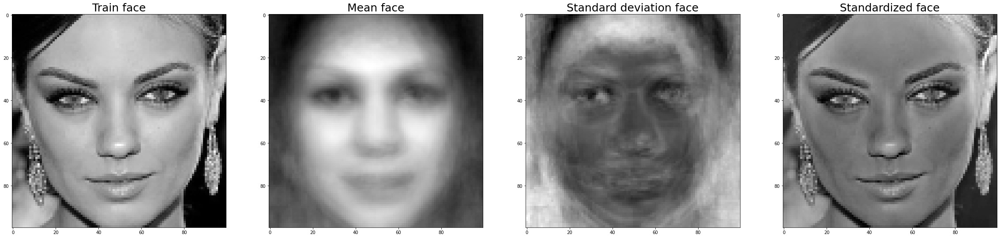

In [36]:
# plot faces side by side
fig,ax = plt.subplots(1,4, figsize=(10*4,10*1))
ax[0].imshow(gray_train_X.reshape((80,100,100))[0],cmap='gray')
ax[0].set_title('Train face', fontsize = 25)
ax[1].imshow(mean_face.reshape((100,100)),cmap='gray')
ax[1].set_title('Mean face', fontsize = 25)
ax[2].imshow(std_face.reshape((100,100)),cmap='gray')
ax[2].set_title('Standard deviation face', fontsize = 25)
ax[3].imshow(standardized_face.reshape((80,100,100))[0],cmap='gray')
ax[3].set_title('Standardized face', fontsize = 25)

We will now make an estimate on the amount of principal components we want to keep. Illustrated by the scree plot we see that 12 components describe 80%, and 27 describe 90% of the variance in the dataset.

(12, 10000)

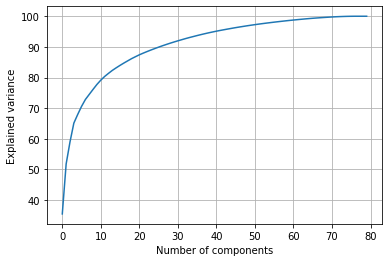

In [37]:
# Plot explained variance against number of principal components
pca_10000 = PCA(n_components=80)
pca_10000.fit(gray_train_X)
plt.grid()
plt.plot(np.cumsum(pca_10000.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

# To explain 80% of the variance we need 12 components
pca_train_X = PCA(0.8).fit(gray_train_X)
pca_train_X.components_.shape

### 1.2.1. Eigenface Plots

We can now display the eigenfaces corresponding to the first 12 principal components. Together, these faces explain 80% of the variance in the data.

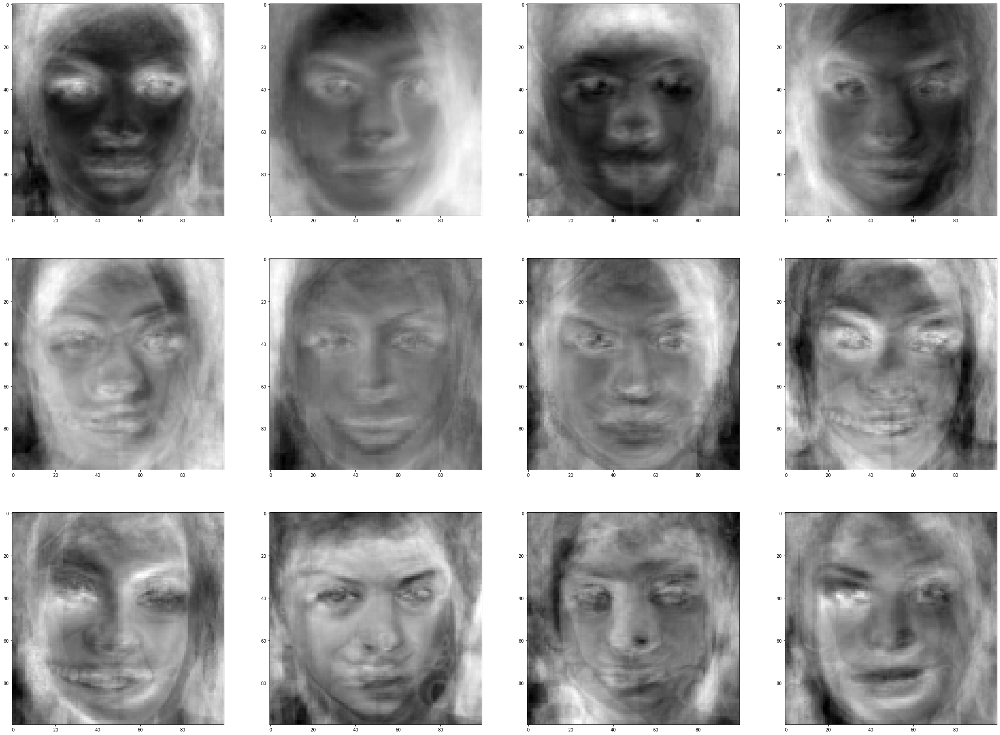

In [38]:
# reshape the eigenfaces to the original image size and dispaly side by side
plot_image_sequence_greyscale(pca_train_X.components_.reshape((12,100,100)), n=12, imgs_per_row=4)

The class PCAFeatureExtractor houses the functions we use to apply PCA to our image dataset.

In [39]:
class PCAFeatureExtractor(IdentityFeatureExtractor):
    
    def __init__(self, n_components):
        self.n_components = n_components
        self.pca = PCA(n_components, whiten=True)
        
        
    def transform(self, X):
        #need here (n_samples, n_pixels), in our case (80,10000)
        return self.pca.fit_transform(X)
        
        
    def inverse_transform(self, X):
        pca_trans = self.pca.fit_transform(X)
        return self.pca.inverse_transform(pca_trans)

In [40]:
# create an object of the class PCAFeatureExtractor with n_components = 12
feat = PCAFeatureExtractor(12)
# transform
pca_trans = feat.transform(gray_train_X)
# inverse transform
pca_inv_trans = feat.inverse_transform(gray_train_X)

In [41]:
pca_trans.shape, pca_inv_trans.shape

((80, 12), (80, 10000))

The PCA has reduced the second dimension from 10000 down to 12 !

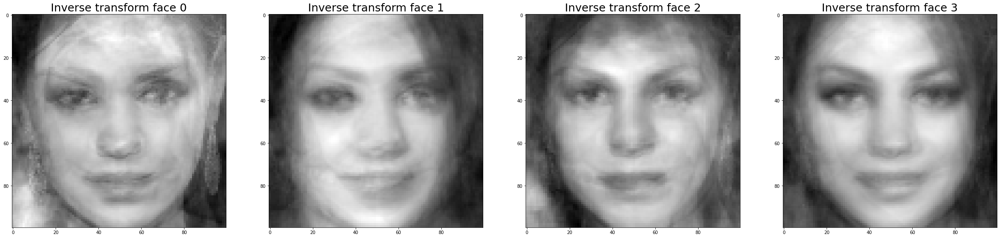

In [42]:
# plot the inverse transform faces
fig,ax = plt.subplots(1,4, figsize=(10*4,10*1))
for  i in range (4):
    ax[i].imshow(pca_inv_trans.reshape((80,100,100))[i],cmap='gray')
    ax[i].set_title('Inverse transform face {i}'.format(i=i), fontsize = 25)

We can also reconstruct the faces using the mean face, standard deviation face and the inverse transform:

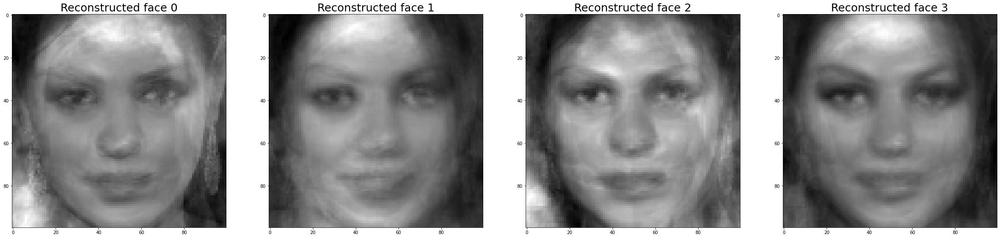

In [43]:
# plot the reconstructed faces
fig,ax = plt.subplots(1,4, figsize=(10*4,10*1))
for  i in range (4):
    ax[i].imshow((mean_face+std_face*pca_inv_trans.reshape((80,10000))).reshape((80,100,100))[i],cmap='gray')
    ax[i].set_title('Reconstructed face {i}'.format(i=i), fontsize = 25)

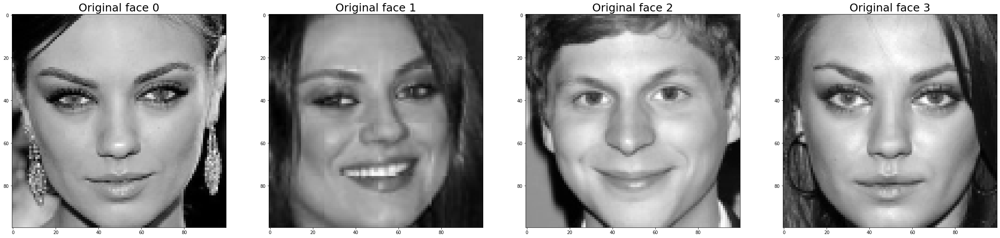

In [44]:
fig,ax = plt.subplots(1,4, figsize=(10*4,10*1))
for  i in range (4):
    ax[i].imshow(gray_train_X[i].reshape(100,100),cmap='gray')
    ax[i].set_title('Original face {i}'.format(i=i), fontsize = 25)

### 1.2.2. Feature Space Plots

In this section we use PCA with 2 principal components to reduce the faces dataset to a 2 dimensional space. Then we plot the faces with relation to these first two principal components.

In [45]:
# aplly PCA with 2 components
feat = PCAFeatureExtractor(2)
pca_trans = feat.transform(gray_train_X)
pca_trans = (pca_trans*1024).astype('int8')+256 

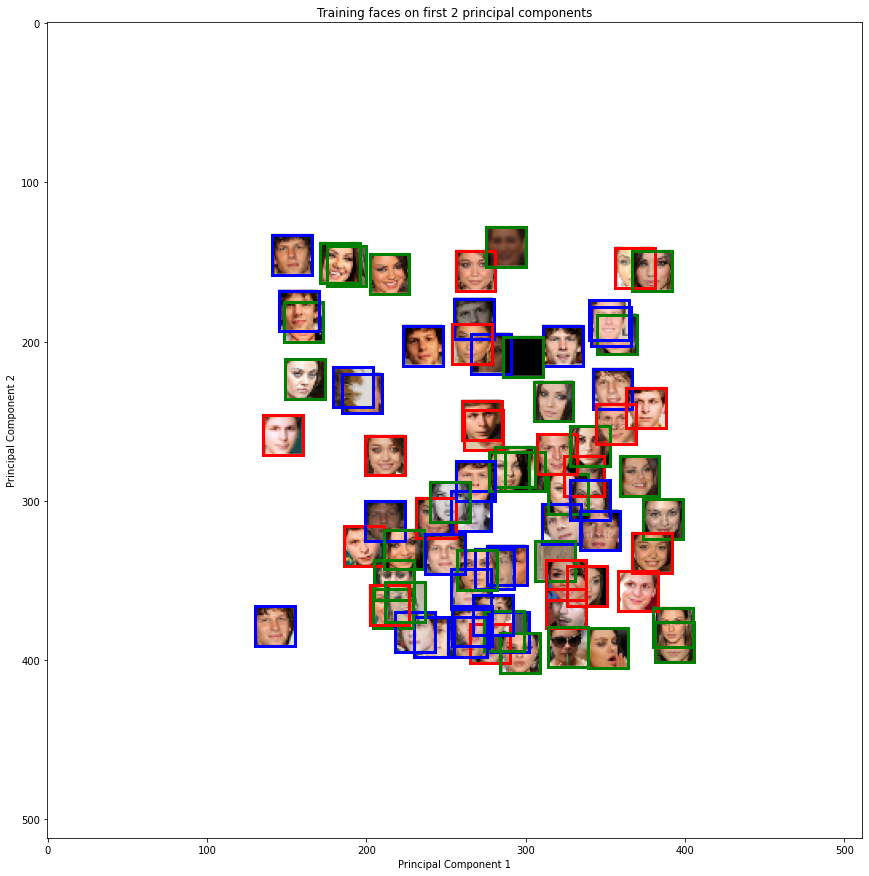

In [46]:
# initialize graph
graph = np.full((512, 512), 255, dtype=np.uint8)
graph = cv2.cvtColor(graph, cv2.COLOR_BGR2RGB)

# for each face in the training data: resize it and add it to the graph
rectangles = []
for i in range(len(train_X)):
    h = 25
    w = 25
    train_i = train_X[i]
    train_i = cv2.resize(train_i,(h,w), interpolation=cv2.INTER_LINEAR_EXACT)
    x = pca_trans[i][0]
    y = pca_trans[i][1]
    graph[y:y+h, x:x+w] = train_i
    
    if train_y[i] == 0:
        color = 'red'
    elif train_y[i] == 1:
        color = 'blue'
    elif train_y[i] == 2:
        color = 'green'
    
    left, bottom, width, height = (x, y, w, h)
    rect=mpatches.Rectangle((left,bottom),height,width, fill=False,color=color,linewidth=3)
    rectangles.append(rect)

# plot the resulting graph
plt.figure(figsize=(15,15))
plt.imshow(graph)
plt.title('Training faces on first 2 principal components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for rect in rectangles:
    plt.gca().add_patch(rect)

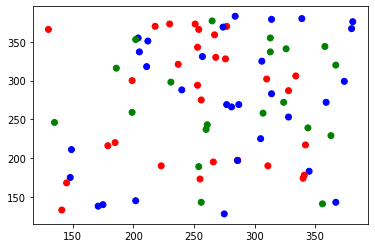

In [47]:
my_dict = {1:'r', 2:'b', 0:'g'}
plt.scatter(pca_trans[:,0],pca_trans[:,1], c=np.vectorize(my_dict.get)(train_y))

### 1.2.3. Discussion

Our choice of p is connected to the amount of variance explained: 12 components describe 80%, and 27 describe 90% of the variance in the dataset.
The more variance included, the less generalizable features the algorithms is learning. However, if we leave only general features, then the model won’t be able to discriminate classes. That’s why the threshold for explained variance is needed, usually is 80-90%.

Furthermore, the number of non-zero eigenvalues in our example is 79, since the number of observations in our train is 80. The number of non-zero principal components is equal to N-1, where N is the number of observations. After fitting 79 components, there is no variations left to build orthogonal vectors on.
For preprocessing before PCA we convert faces into fray scale and flattened the picture 2D matrix into 1D vector after that the vectors for the faces were stacked. So, the first column contained list of left upper corner across all pictures in the training dataset and so on. Grayscale data helps to compress information from 3 channels to 1.

Furthermore, before PCA the features should have approximately zero mean and similar variance. The variance issue is solved by using grayscale image, so for the solution pipelines the data should be mean normalized.
Finally, we should note using whiten=True parameter, which helps to get rid of adjacent pixels correlation.

# 2. Evaluation Metrics
## 2.0. Accuracy

Accuracy can be used for evaluating a binary classification task, eg where the classifier needs to determine if a given image is indeed Jesse Eisenberg (1) or not (0)

In binary classifcation accuracy is computed as follows:
$acc  = \frac{TP+TN}{TP+TN+FP+FN}$ 

with 
* TP = number of True Positives: Images of Jesse correctly classified as 1
* TN = number of True Negatives: Images of someone else correctly classified as 0
* FP = number of False Positives: Images of someone else incorrectly classified as 1
* FN = number of False Negatives: Images of Jesse incorrectly classified as 0


Since we're working with a rather balanced dataset: 30 images of Jesse, 30 images of Mila and 20 images of other people, accuracy can be used as a decent evaluation metric. However when dataset in highly skewed, this might not be the case. 

Suppose the testset contains 1000 images of Jesse and 1 image of Mila. The task is to correctly classify these images, an algorithm that always classifies every image as 1 (Jesse) will have zero knowledge implemented, however, the obtained accuracy becomes:

$acc  = \frac{1000+0}{1000+0+1+0} \approx 1$

Therefore, we need to make sure that the datasets approximately balanced when using accuracy as an evaluation metric

## 2.1. F1-score

The F1-score is a measure of a test’s accuracy, it is the harmonic mean of precision and recall. 

$precision  = \frac{TP}{TP+FP}$ : How many of the images classified as positive are relevant?

$recall     = \frac{TP}{TP+FN}$ : How many of the positive images are actually classified as positive?

$F1 = \frac{2TP}{2TP+FP+FN} $

Because the F1 score is an harmonic mean, extreme values are penalized. An F1-score of 1 indicates a perfect precision and recall and therefore is desired. 


## 2.2. ROCAUC

The Area Under the Curve (AUC) of the Receiver Operator Curve (ROC) is, as accuracy, susceptible to skewed datasets, therefore it should be checked that the amount of entries for each class is roughly the same. In the ROC curve the TP-rate is plotted against the FP-rate for different thresholds, the closer the curve reaches the top left corner the better the classification. This corresponds to maximizing the TP (top) and minimizing the FP (left).

The AUC makes it easy to compare different ROC curves using a single value, the closer the ROC curve to this desired corner, the larger the area under the curve will be, therefore a large AUC is desired.


## 2.3. Confusion matrix

||       | Predicted | condition|
|:---| :--- :       |    :----:   |   ---: |
||Total # images     | Positive       | Negative  |
|Actual  |Positive | TP        | FN      |
|Actual | Negative   | FP        | TN      |


The confusion matrix is an excellent metric to gather more insight in the classification process. Because the TP,FP,TN and FN values are visible it's give a better insight in the performance than eg the accuracy where this is all combined in one metric. For some classification systems it can be desired to focus on minimizing the FN rate, where an increase in FP is of lesser importance. This trade-off and evaluation can be done using the confusion matrix. 

In [48]:
from sklearn.metrics import accuracy_score

# 3. Classifiers
## 3.0. Example: The *'not so smart'* classifier
This random classifier is not very complicated. It makes predictions at random, based on the distribution obseved in the training set. **It thus assumes** that the class labels of the test set will be distributed similarly to the training set.

In [49]:
class RandomClassificationModel:
    """Random classifier, draws a random sample based on class distribution observed 
    during training."""
    
    def fit(self, X, y):
        """Adjusts the class ratio instance variable to the one observed in y. 

        Parameters
        ----------
        X : tensor
            Training set
        y : array
            Training set labels

        Returns
        -------
        self : RandomClassificationModel
        """
        
        self.classes, self.class_ratio = np.unique(y, return_counts=True)
        self.class_ratio = self.class_ratio / self.class_ratio.sum()
        return self
        
    def predict(self, X):
        """Samples labels for the input data. 

        Parameters
        ----------
        X : tensor
            dataset
            
        Returns
        -------
        y_star : array
            'Predicted' labels
        """

        np.random.seed(0)
        return np.random.choice(self.classes, size = X.shape[0], p=self.class_ratio)
    
    def __call__(self, X):
        return self.predict(X)
    

## 3.1. Baseline 1: My favorite classifier
...

In [50]:
from sklearn.ensemble import RandomForestClassifier

class FavoriteClassificationModel:
    """TODO: this classifier is under construction."""
    def __init__(self):
        self.classifier = RandomForestClassifier(random_state=0)
        
    def fit(self, X, y):
        return self.classifier.fit(X,y)
        
    def predict(self, X):
        return self.classifier.predict(X)

In [51]:
cl = FavoriteClassificationModel()
cl.fit(pca_trans, train_y)
train_y_star = cl.predict(pca_trans)

print(accuracy_score(train_y, train_y_star))

0.9875


## 3.2 Grid Search 

As our first classification pipeline we have chosen to perform multiclass classification on grayscale pictures. The hyperparameters and models were tuned with Randomized Grid Search.

As possible candidates we have chosen Logistic Regression, Random Forest, XGBoost and KNN classifiers.

For the metric to optimize, for the multiclass problem we chose balanced accuracy

In [52]:
# https://towardsdatascience.com/how-to-tubalanced_accuracy_scoreultiple-ml-models-with-gridsearchcv-at-once-9fcebfcc6c23
# Auto log all the parameters, metrics, and artifacts
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb

from sklearn.metrics import confusion_matrix, balanced_accuracy_score,\
                            f1_score,roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(gray_train_X, train_y, test_size=0.2, random_state=42)


scoring = ['balanced_accuracy','f1_micro',"f1_macro","f1_weighted",'roc_auc_ovr']
# model1 = LogisticRegression(random_state=42,multi_class="multinomial")
model1 = LogisticRegression(random_state=42,multi_class="ovr",solver = 'liblinear') #to choose
model2 = RandomForestClassifier(random_state=42)
model3 = xgb.XGBClassifier(random_state=42,use_label_encoder=False)
model4 = KNeighborsClassifier()

# Initiaze the hyperparameters for each dictionary

param1 = {}
param1['classifier__C'] = [10**-2, 10**-1, 10**0, 10**1, 10**2]
param1['classifier__penalty'] = ['l1', 'l2']
param1['classifier'] = [model1]

param2 = {}
param2['classifier__n_estimators'] = [10, 50, 100, 250]
param2['classifier__max_depth'] = [5, 10, 20]
param2['classifier'] = [model2]

param3 = {}
param3['classifier__eta'] = [0.1,0.3,0.5,0.7]
param3['classifier__max_depth'] = [5, 10, 20]
param3['classifier'] = [model3]

param4 = {}
param4['classifier__n_neighbors'] = [3,5,7,10]
param4['classifier__p'] = [1, 2]
param4['classifier'] = [model4]



pipeline = Pipeline([('classifier', model1)])
params = [param1, param2, param3, param4]

rs = RandomizedSearchCV(pipeline, params, scoring=scoring, 
                          refit='balanced_accuracy', cv =4, n_jobs=-1)

print("Starting fitting")

rs.fit(X_train, y_train)


Starting fitting
[21:36:12] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=4,
                   estimator=Pipeline(steps=[('classifier',
                                              LogisticRegression(multi_class='ovr',
                                                                 random_state=42,
                                                                 solver='liblinear'))]),
                   n_jobs=-1,
                   param_distributions=[{'classifier': [LogisticRegression(multi_class='ovr',
                                                                           random_state=42,
                                                                           solver='liblinear')],
                                         'classifier__C': [0.01, 0.1, 1, 10,
                                                           100],
                                         'classifier__penalty': ['l1', 'l2']},
                                        {'classifier': [Rand...
                                                              

In [53]:
rs.best_estimator_

Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eta=0.1, gamma=0, gpu_id=-1,
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.100000001, max_delta_step=0,
                               max_depth=20, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=4, num_parallel_tree=1,
                               objective='multi:softprob', predictor='auto',
                               random_state=42, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=None, subsample=1,
                               tree_method='exact', use_label_encoder=False,
                          

In [54]:
rs.best_score_

0.726388888888889

The best model in current pipeline turned out to be XGBoost, which showed 0.694 accuracy during cross validation

In [55]:
pred_prob = rs.predict_proba(X_test)
y_pred = rs.best_estimator_.predict(X_test)


To check performance of our model from different perspectives, we also estimated the following metrics: f1-macro, f1-micro, f1-weights, and ROC-AUC macro

Macro metrics calculated each metric independently for each class and then take the average, hence all classes are treated equally. In micro metrics true positives and negatives are calculated globally, which helps to take into account class imbalance. Weighted metric is macro metric but average of classes is weighted.

In our case we don't have severe class imbalance in training data, so all metrics are acceptable.

In [56]:
def eval_metrics(actual, pred):
    acc = balanced_accuracy_score(actual, pred)
    f1_micro = f1_score(actual, pred, average = "micro")
    f1_macro = f1_score(actual, pred, average = "macro")
    f1_weighted = f1_score(actual, pred, average = "weighted")
    result = {
        "acc":acc,
        "f1_micro":f1_micro,
        "f1_macro":f1_macro,
        "f1_weighted":f1_weighted
    }
    return result

In [57]:
def roc_auc_score_multiclass(actual_class, pred_class, average = "macro"):

    #creating a set of all the unique classes using the actual class list
    unique_class = set(actual_class)
    roc_auc_dict = {}
    for per_class in unique_class:
        #creating a list of all the classes except the current class 
        other_class = [x for x in unique_class if x != per_class]

        #marking the current class as 1 and all other classes as 0
        new_actual_class = [0 if x in other_class else 1 for x in actual_class]
        new_pred_class = [0 if x in other_class else 1 for x in pred_class]

        #using the sklearn metrics method to calculate the roc_auc_score
        roc_auc = roc_auc_score(new_actual_class, new_pred_class, average = average)
        roc_auc_dict[per_class] = roc_auc

    return roc_auc_dict

In [58]:
eval_metrics(y_test,y_pred)

{'acc': 0.611111111111111,
 'f1_micro': 0.5,
 'f1_macro': 0.42407407407407405,
 'f1_weighted': 0.5576388888888889}

In [59]:
roc_auc_score_multiclass(y_test, y_pred, average="macro")

{0: 0.7666666666666666, 1: 0.8333333333333333, 2: 0.5333333333333333}

<AxesSubplot:>

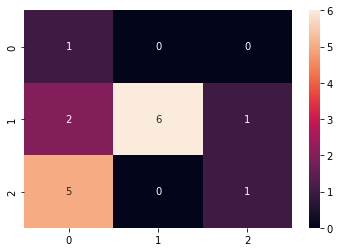

In [60]:
import seaborn as sns
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True,fmt='g')

Our accuracy on training is 0.54, f1 is interval from 0.34 to 0.42.

ROC-AUC score implies that the worst recognised class is Mila Kunis, while doppelganger class is best recongnisable.

From confusion matrix we can notice that we confuse Mila Kunis with Sarah Hyland, while Jesse Eisenberg is perfectly distinguished

In [61]:
#submit
# rs.best_estimator_.fit(gray_train_X, train_y)
# pred = rs.best_estimator_.predict(gray_test_X)

In [62]:
# submission = test.copy().drop('img', axis = 1)
# submission['class'] = pred

# submission.to_csv('submission.csv')

## 3.3 Grid search with PCA

As a second step we decided to incorporate the features learnt by PCA into our classification pipeline to try to improve the accuracy.

As possible candidates we have chosen Logistic Regression, Random Forest, XGBoost and KNN classifiers.

For the metric to optimize, for the multiclass problem we chose balanced accuracy

In [63]:
pca = PCA().fit(gray_train_X)

In [64]:
# https://towardsdatascience.com/how-to-tubalanced_accuracy_scoreultiple-ml-models-with-gridsearchcv-at-once-9fcebfcc6c23
# Auto log all the parameters, metrics, and artifacts
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb

from sklearn.metrics import confusion_matrix, balanced_accuracy_score,\
                            f1_score,roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(gray_train_X, train_y, test_size=0.2, random_state=42)

# binary case
# scoring = ['accuracy','f1','precision','recall','roc_auc']

scoring = ['balanced_accuracy','f1_micro',"f1_macro","f1_weighted",'roc_auc_ovr']
model1 = LogisticRegression(random_state=42,multi_class="ovr",solver = 'liblinear', max_iter=1000) #to choose
model2 = RandomForestClassifier(random_state=42)
model3 = xgb.XGBClassifier(random_state=42,use_label_encoder=False)
model4 = KNeighborsClassifier()

# Initialize the hyperparameters for each dictionary

param1 = {}
param1['classifier__C'] = [10**-2, 10**-1, 10**0, 10**1, 10**2]
param1['classifier__penalty'] = ['l2']
param1['classifier'] = [model1]
param1['pca__n_components'] = [12, 27, 48] #12 = 80%, 27= 90% of variance in the data 

param2 = {}
param2['classifier__n_estimators'] = [10, 50, 100, 250]
param2['classifier__max_depth'] = [5, 10, 20]
param2['classifier'] = [model2]
param2['pca__n_components'] = [12, 27, 48]

param3 = {}
param3['classifier__eta'] = [0.1,0.3,0.5,0.7]
param3['classifier__max_depth'] = [5, 10, 20]
param3['classifier'] = [model3]
param3['pca__n_components'] = [12, 27, 48]

param4 = {}
param4['classifier__n_neighbors'] = [3,5,7,10]
param4['classifier__p'] = [1, 2]
param4['classifier'] = [model4]
param4['pca__n_components'] = [12, 27, 48]



pipeline = Pipeline([('pca', pca),('classifier', model1)])
params = [param1, param2, param3, param4]

rs = RandomizedSearchCV(pipeline, params, scoring=scoring, 
                          refit='balanced_accuracy', cv =4, n_jobs=-1)

print("Starting fitting")

rs.fit(X_train, y_train)



Starting fitting


RandomizedSearchCV(cv=4,
                   estimator=Pipeline(steps=[('pca', PCA()),
                                             ('classifier',
                                              LogisticRegression(C=0.01,
                                                                 max_iter=1000,
                                                                 multi_class='ovr',
                                                                 random_state=42,
                                                                 solver='liblinear'))]),
                   n_jobs=-1,
                   param_distributions=[{'classifier': [LogisticRegression(C=0.01,
                                                                           max_iter=1000,
                                                                           multi_class='ovr',
                                                                           random_state=42,
                                                         

In [65]:
df = rs.cv_results_
df["mean_test_balanced_accuracy"]

array([0.58611111, 0.64166667, 0.55277778, 0.54305556, 0.6       ,
       0.69861111, 0.67083333, 0.58055556, 0.62361111, 0.67083333])

In [66]:
rs.best_score_

0.6986111111111111

The best model in current pipeline turned out to be Logistic Regression, which showed 0.69 accuracy during cross validation. A similar result to the classification pipeline without PCA. For more details, we will dive into the other metrics to establish if there was a significant improvement in prediction quality.

In [67]:
pred_prob = rs.predict_proba(X_test)
y_pred = rs.best_estimator_.predict(X_test)

In [68]:
eval_metrics(y_test,y_pred)

{'acc': 0.8703703703703703,
 'f1_micro': 0.8125,
 'f1_macro': 0.7702991452991453,
 'f1_weighted': 0.8223157051282052}

In [69]:
roc_auc_score_multiclass(y_test, y_pred, average="macro")

{0: 0.9666666666666667, 1: 0.8888888888888888, 2: 0.8166666666666668}

<AxesSubplot:>

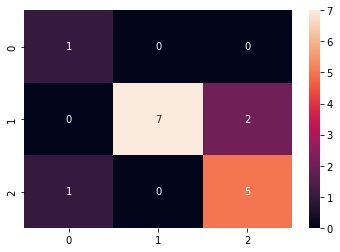

In [70]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True,fmt='g')

We do see an improvement on the other metrics: f1-macro, f1-micro, f1-weights, and ROC-AUC macro.

Our accuracy on training has increased to 0.8, and the f1 interval now ranges from 0.64 to 0.7.

The ROC-AUC scores have also increased and still demonstrates that the worst recognised class is Mila Kunis, even though there was a significant improvement on this class (from 0.48 to 0.77) and it is now almost on par with the class Jesse Eisenberg. The doppelganger class remains the best recognisable class.

In the confusion matrix we now see that we no longer confuse Mila Kunis with Sarah Hyland. However, some confusion is introduced between Mila and Jesse.

## 3.4. Baseline 2: Bag of visual words

The 'Bag of Visual Words' technique is often used in image classification, the idea comes from the similar 'bag of words' technique in natural language processing. In our application, instead of words we make use of image features obtained through the SIFT or HOG feature extractors. 

The technique goes as follows:

1.  We extract the local features from the images using said feature extractors
2.  We cluster the features using k-means clustering, the centerpoints of each cluster represent the 'visual words'
3.  The local features are compared with the visual words to create histograms for each image
4.  When a new image is fed into the system, the features are extracted and compared with the visual words to create a histogram
5.  The class or name of the person on the image is predicted through nearest neighbour classification. 


In [71]:
#we start by splitting the training data in a train and test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(allfaces, allfaces_classes, test_size=0.2, random_state=42)

#we calculate the descriptors of the training images
sift_feature_extractor = SIFTFeatureExtractor()

descriptor_list = [] #here all the descriptors will be stored together for all training images
for i in range(len(X_train)):
    train_X_i = X_train[i]
    kp, des = sift_feature_extractor.extract_descriptors_normalized(train_X_i, nfeatures = 200, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
    descriptor_list.append(des)

#next we separate the descriptors by class
j = []
m = []
o = []
for i in range(len(descriptor_list)):
    des = descriptor_list[i]
    if y_train[i] == 0:
        o.append(des)
    if y_train[i] == 1:
        j.append(des)
    if y_train[i] == 2:
        m.append(des)
        
all_bovw_feature = {"0":o,"1":j,"2":m} #in this dictionary the descriptors are separated by class

In [72]:
#we do the same for the test data

descriptor_list_test = [] 
for i in range(len(X_test)):
    test_X_i = X_test[i]
    kp, des = sift_feature_extractor.extract_descriptors(test_X_i, nfeatures = 200, contrast_threshold=0.1, edge_threshold=30,nOctaveLayers=3,sigma=0.45)
    descriptor_list_test.append(des)
    
#next we separate the descriptors by class
j = []
m = []
o = []
j_img = []
m_img = []
o_img = []
for i in range(len(descriptor_list_test)):
    des = descriptor_list[i]
    img = X_test[i]
    if y_test[i] == 0:
        o.append(des)
        o_img.append(img)
    if y_test[i] == 1:
        j.append(des)
        j_img.append(img)
    if y_test[i] == 2:
        m.append(des)
        m_img.append(img)
        
test_bovw_feature = {"0":o,"1":j,"2":m} 
test_images_sorted = np.concatenate((np.array(o_img),np.array(j_img),np.array(m_img)))
y_values_sorted = np.concatenate((np.full(len(o),0),np.full(len(j),1),np.full(len(m),2)))

In [73]:
#using KMeans clustering, we calculate the visual words
from sklearn.cluster import KMeans

def kmeans(k, descriptor_list):
    kmeans = KMeans(n_clusters = k, n_init=10)
    kmeans.fit(descriptor_list)
    visual_words = kmeans.cluster_centers_ 
    return visual_words

In [74]:
#the descriptor_list contains n items with n the amount of images in the training set
#each item is an  [ r x 128] array with r the amount of features found in each image
#in order to be able to perform a k-means clustering, this list needs to be flattened to an [ n*r x 128] array

descriptor_list_flat = [item for sublist in descriptor_list for item in sublist]

#we create 250 different clusters, this number gave the best results during our tests
visual_words = kmeans(250, descriptor_list_flat) 


print('length descriptor list:', len(descriptor_list))
print('amount of training images:',len(X_train))
print('amount of descriptors found in the first training image:',len(descriptor_list[0]))
print('total amount of descriptors found in all training images:',len(descriptor_list_flat))
print('length of each descriptor:',len(descriptor_list_flat[0]))



length descriptor list: 56
amount of training images: 56
amount of descriptors found in the first training image: 3
total amount of descriptors found in all training images: 2262
length of each descriptor: 128


In [75]:
from scipy.spatial import distance

def find_index(image, center):
    count = 0
    ind = 0
    for i in range(len(center)):
        if(i == 0):
           count = distance.euclidean(image, center[i]) 
        else:
            dist = distance.euclidean(image, center[i]) 
            if(dist < count): #the distance to each cluster is calculated, index of the closest cluster is returned
                ind = i
                count = dist
    return ind #index of closest cluster

def image_class(all_bovw, centers):
    dict_feature = {}
    for key,value in all_bovw.items():
        category = []
        for img in value:
            histogram = np.zeros(len(centers))
            for each_feature in img:
                ind = find_index(each_feature, centers)
                histogram[ind] += 1
            category.append(histogram)
        dict_feature[key] = category
    return dict_feature
    
# Creates histograms for train data    
bovw_train = image_class(all_bovw_feature, visual_words) 
# Creates histograms for test data
bovw_test = image_class(test_bovw_feature, visual_words) 


In [76]:

#to predict the class/person of the test image, we make use of 1-Nearest Neighbour classification
#here the histograms of the training set is compared to the test set 

def knn(features_train, features_test):
    num_test = 0
    correct_predict = 0
    class_based = {}
    predictions = []
    
    for test_key, test_val in features_test.items():
        class_based[test_key] = [0, 0] # [correct, all]
        for tst in test_val:
            predict_start = 0
            minimum = 0
            key = "a" 
            for train_key, train_val in features_train.items():
                for train in train_val:
                    if(predict_start == 0):
                        minimum = distance.euclidean(tst, train)
                        key = train_key
                        predict_start += 1
                    else:
                        dist = distance.euclidean(tst, train)
                        if(dist < minimum):
                            minimum = dist
                            key = train_key
            
            if(test_key == key):
                correct_predict += 1
                class_based[test_key][0] += 1
            num_test += 1
            class_based[test_key][1] += 1
            predictions.append(key)
    return [num_test, correct_predict, class_based,predictions]


In [77]:
results_bowl = knn(bovw_train, bovw_test) 


In [78]:
def accuracy(results):
    avg_accuracy = np.round((results[1] / results[0]) * 100,2)
    print("Average accuracy: %" + str(avg_accuracy))
    print("\nClass based accuracies: \n")
    for key,value in results[2].items():
        acc = (value[0] / value[1]) * 100
        print(key + " : %" + str(acc))
        
# Calculates the accuracies and write the results to the console.       
accuracy(results_bowl) 

Average accuracy: %33.33

Class based accuracies: 

0 : %0.0
1 : %75.0
2 : %25.0


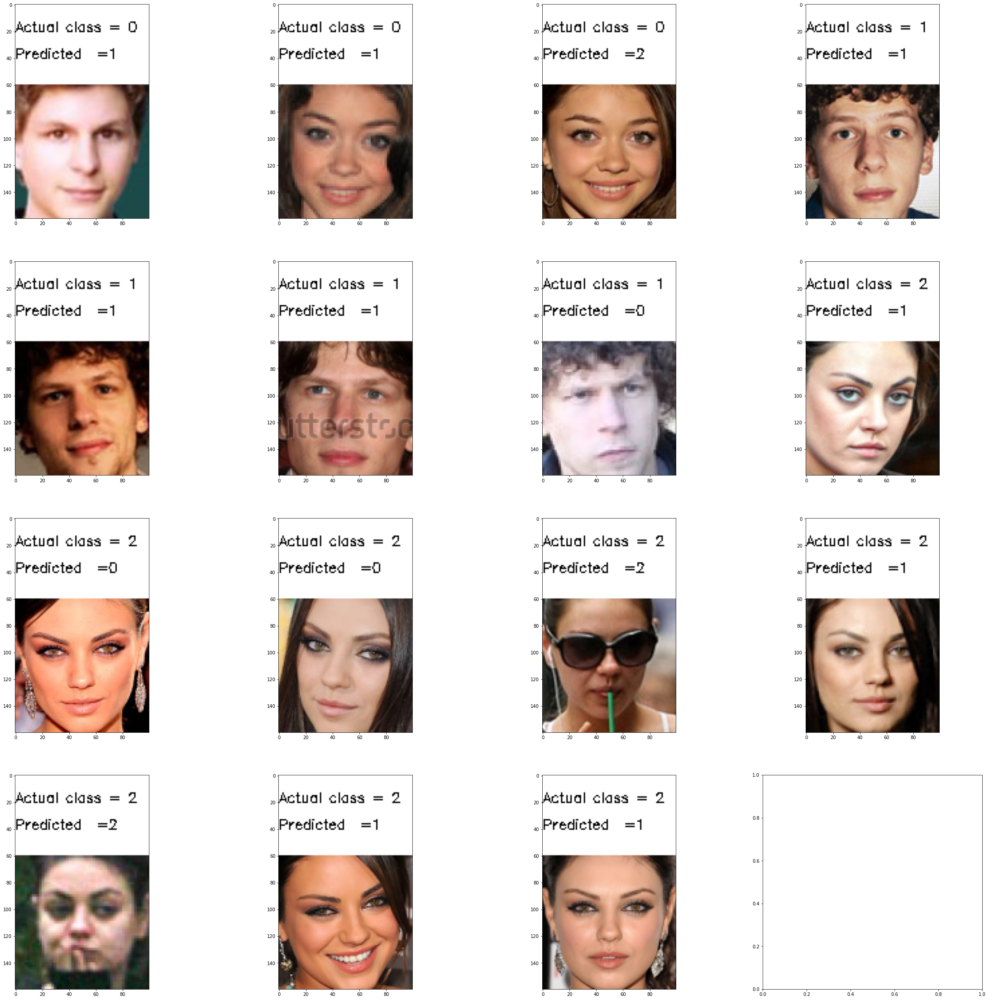

In [79]:
width = X_test[i].shape[1]

results = []
for i in range(len(test_images_sorted)):
    textSpace = np.full((60, width,3),255, dtype=np.uint8)
    image = np.array(test_images_sorted[i],dtype=np.uint8)
    text1 = 'Actual class = ' + str(y_values_sorted[i])
    text2 = 'Predicted  =' +str(results_bowl[3][i])
    textSpace = cv2.putText(img=textSpace, text=text1 ,org=(0,20), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.34, color=(0,0,0), thickness=1)
    textSpace = cv2.putText(img=textSpace, text=text2 ,org=(0,40), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.34, color=(0,0,0), thickness=1)
    result = cv2.vconcat([textSpace, image])
    results.append(result)
    
plot_image_sequence(results, n=len(results), imgs_per_row=4)


As can be seen above, the results obtained are far from good using the SIFT descriptors and bag of visual words in combination with a 1-NN classifier. We can try out the different classifiers as been used on the PCA features. The approach would be the same where we try out different classifiers and see what works best. To avoid publishing multiple times the same approach we keep this part in the PCA approach.

# 4. Experiments
<div class="alert alert-block alert-info"> <b>NOTE:</b> Do <i>NOT</i> use this section to keep track of every little change you make in your code! Instead, highlight the most important findings and the major (best) pipelines that you've discovered.  
</div>
<br>

## 4.1. Convolutional Neural Network with Keras 
<p>A last possible approach in order to classify the celebrity's images consists in the use of an convolutional neural network. <b>Convolutional neural networks (CNN)</b> are popular in the field of image classification, which is thus perfectly applicable in this case. Different Python libraries exist in order to implement such networks, however in this example <b>Keras</b> is used. It offers a simple and efficient way of implementing different artificial intelligence models, including CNNs. This section discusses step-by-step how the model is created and applied.<p>

## 4.1.1. Additional imports

First of all, additional libraries are imported. First, and most import, keras from tensorflow. Besides, the random library and the train_test_split function are utilities which are used during the preprocessing of the data.

In [80]:
# Should already be defined and imported
import cv2
import os

import numpy as np
import pandas as pd

from urllib import request

from matplotlib import pyplot as plt

def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

# 1. Additional imports

print("\n### 1. Aditional imports ###\n")

import tensorflow.keras as kr
import random as rd

from sklearn.model_selection import train_test_split


### 1. Aditional imports ###



## 4.1.2 Class definition: Modified HAAR face detector

<p>In previous sections, a basic HAAR preprocessor was used in order to detect faces in the original images. However, this preprocessor outputs a high percentage of non-defined images. In the following applications, this could lead to the introduction of some errors in the trained model, and hence in a lower accuracy during prediction. Therefore, a modified HAAR preprocessor is defined. The first version of the HAAR preprocessor includes a single classifier, namely a frontal face classifier. In this modified version <b>a profile classifier</b> is applied if no faces were discovered using the first one. Hence, the percentage of non-defined images is lowered. In addition, some parameters of the original preprocessor were adjusted. Those are marked in the code.</p>


In [81]:
# 2. Class definition: Modified HAAR face detector

print("\n### 2. Class definition: Modified HAAR face detector ###\n")

class ModifiedHAARPreprocessor():    
    def __init__(self, path, face_size):
        self.face_size = face_size
        
        file_path_frontal = os.path.join(path, "haarcascade_frontalface_alt2.xml")
        if not os.path.exists(file_path_frontal): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path_frontal, "frontal")
        
        file_path_profile = os.path.join(path, "haarcascade_profileface.xml")
        if not os.path.exists(file_path_profile): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path_profile, "profile")
        
        self.classifier_frontal = cv2.CascadeClassifier(file_path_frontal)
        self.classifier_profile = cv2.CascadeClassifier(file_path_profile)
  
    def download_model(self, path, model_type):
        url = None
        if model_type == "frontal":
            url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt2.xml"
        elif model_type == "profile":
            url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_profileface.xml"
        
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_faces(self, img, classifier_type):        
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        if classifier_type == "frontal":
            return self.classifier_frontal.detectMultiScale(
                img_gray,
                scaleFactor=1.1, # Adjusted from 1.2 to 1.1
                minNeighbors=5,
                minSize=(30, 30),
                flags=cv2.CASCADE_SCALE_IMAGE
            )
        elif classifier_type == "profile":
             return self.classifier_profile.detectMultiScale(
                img_gray,
                scaleFactor=1.1,
                minNeighbors=5,
                minSize=(30, 30),
                flags=cv2.CASCADE_SCALE_IMAGE
            )       
        
    def extract_faces(self, img, classifier_type):        
        faces = self.detect_faces(img, classifier_type)

        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]
    
    def preprocess(self, data_row):
        """
        1. Frontal
        
        Firstly, the frontal classifier is applied.
        If more than one face is discovered, return the second one. This was tested and delivered better results
        Else if a single face is discovered, return the face.
        """
        
        faces = self.extract_faces(data_row['img'], "frontal")
        
        if len(faces) > 1:
            return cv2.resize(faces[1], self.face_size, interpolation = cv2.INTER_AREA)
        elif len(faces) == 1:
            return cv2.resize(faces[0], self.face_size, interpolation = cv2.INTER_AREA)
        
        """
        2. Profile
        
        If still no faces were discovered, the profile classifier is applied.
        The same steps (if statements) as for the frontal classifier results are applied.
        """
        
        faces = self.extract_faces(data_row['img'], "profile")
        
        if len(faces) > 1:
            return cv2.resize(faces[1], self.face_size, interpolation = cv2.INTER_AREA)
        elif len(faces) == 1:
            return cv2.resize(faces[0], self.face_size, interpolation = cv2.INTER_AREA)
        
        """
        If after applying both classifiers there are still no faces discovered, a non-defined image is returned
        """
        
        nan_img = np.empty(self.face_size + (3,))
        nan_img[:] = np.nan
        return nan_img
                
    def __call__(self, data):
        return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)


### 2. Class definition: Modified HAAR face detector ###



## 4.1.3. Data loading and face detection

<p>In this part, the train and test data are read again. Furthermore, the modified HAAR preprocessor is applied on both datasets. Finally the data is separated into on the one hand <b>the X and y vectors used for the model construction</b> and on the other hand <b>the submission vector</b> which corresponds to the test dataset.</p>

In [82]:
# 3. Data loading and face detection

print("\n### 3. Data loading and face detection ###\n")

train = pd.read_csv('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/train_set.csv', index_col = 0)
train.index = train.index.rename('id')
test = pd.read_csv('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2022/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]

FACE_SIZE = (128, 128)
preprocessor = ModifiedHAARPreprocessor(path = '../../tmp', face_size=FACE_SIZE)

X = preprocessor(train)
y = train['class'].values

submission = preprocessor(test)

# For information

print("X: " + str(X.shape))
print("submission: " + str(submission.shape))
print("y: " + str(y.shape))


### 3. Data loading and face detection ###

X: (80, 128, 128, 3)
submission: (1816, 128, 128, 3)
y: (80,)


## 4.1.4. Data preprocessing
Prior to the model construction, the data is preprocessed. Three preprocessing steps are applied in order to create the input for the model.

## A Data rescaling
The HAAR face detector already allows to choose the size of the outputted images. Hence, only a rescaling of the pixel intensities is required. The pixel intensities are rescaled from range 0-255 to range 0-1. This is a popular normalization approach in neural networks applications.

In [83]:
# 4. Data preprocessing

print("\n### 4. Data preprocessing ###\n")

    # A. Data rescaling
    
print("\n--- A. Data rescaling ---\n")

rescale = kr.Sequential([
    kr.layers.Rescaling(1./255)
])

X_rescaled = rescale(X).numpy()
submission_rescaled = rescale(submission).numpy()

# Only the images are rescaled
y_rescaled = y 

# For information

print("X_rescaled: " + str(X_rescaled.shape))
print("submission_rescaled: " + str(submission_rescaled.shape))
print("y_rescaled: " + str(y_rescaled.shape))


### 4. Data preprocessing ###


--- A. Data rescaling ---



2022-04-12 21:42:00.340029: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


X_rescaled: (80, 128, 128, 3)
submission_rescaled: (1816, 128, 128, 3)
y_rescaled: (80,)


## B. Data splitting

<p>A second step consists in splitting the data in three different sets: training set, validation set and test set. This is done by applying the train_test_split function on the current data, specifying the desired percentages. Furthermore the data is also shuffled. The data is first split into <b>50% training data and 50% test and validation data</b>. The following data augmentation step explains the choice of the low percentage for the training data. Furthermore, the train/validation data is split into 50% test data and 50% validation data. This results in the following division:</p>

<ul>
  <li>Training: <b>50%</b> (40 images)</li>
  <li>Validation: <b>25%</b> (20 images)</li>
  <li>Test: <b>25%</b> (20 images)</li>
</ul> 

In [84]:
    # B. Data splitting
    
print("\n--- B. Data splitting ---\n")

train_X, test_validation_X, train_y, test_validation_y = train_test_split(X_rescaled, y_rescaled, test_size=0.5, shuffle=True)
validation_X, test_X, validation_y, test_y = train_test_split(test_validation_X, test_validation_y, test_size=0.5, shuffle=True)

# For information

print("train_X: " + str(train_X.shape))
print("train_y: " + str(train_y.shape))
print("validation_X: " + str(validation_X.shape))
print("validation_y: " + str(validation_y.shape))
print("test_X" + str(test_X.shape))
print("test_y: " + str(test_y.shape)) 


--- B. Data splitting ---

train_X: (40, 128, 128, 3)
train_y: (40,)
validation_X: (20, 128, 128, 3)
validation_y: (20,)
test_X(20, 128, 128, 3)
test_y: (20,)


## C. Data augmentation

The use of a CNN for classification purpose requires much data. However, the original training set only contains 80 items, worse still, it only contains 40 images after data splitting. In order to properly train the model more data is required, hence a final step consists in data augmentation. Fortunately, Keras offers different ways to create transformed versions of an orginal image. For this application, four different transformations were applied: <b>RandomFlip, RandomRotation, RandomContrast, RandomZoom</b>. This set of transformations is applied 10 times for each image in the training set, <b>which increases the size of the set by a factor of 10</b>.

In [85]:
# C. Data augmentation
    
print("\n--- C. Data augmentation ---\n")


data_augmentation = kr.Sequential([
    kr.layers.RandomFlip(mode="horizontal", seed=42),
    kr.layers.RandomRotation(factor=0.1, seed=42),
    kr.layers.RandomContrast(factor=0.2, seed=42),
    kr.layers.RandomZoom(height_factor=-0.2, seed=42)
])

number_of_variances = 10
train_X_augmented = np.zeros((train_X.shape[0] * number_of_variances, 128, 128, 3))
train_y_augmented = np.zeros((train_y.shape[0] * number_of_variances))
for i in range(train_X.shape[0]):
    for j in range(number_of_variances):
        k = (number_of_variances * i) + j
        
        # New transformation
        train_X_augmented[k] = data_augmentation(train_X[i])
        
        # The y label should correspond to the original image
        train_y_augmented[k] = train_y[i] 

# The set is shuffled    
ind_list = list(range(train_X_augmented.shape[0]))
rd.shuffle(ind_list)
train_X_augmented  = train_X_augmented[ind_list, :,:,:]
train_y_augmented = train_y_augmented[ind_list,]
        
# For information

print("train_X_augmented: " + str(train_X_augmented.shape))
print("train_y_augmented: " + str(train_y_augmented.shape))


--- C. Data augmentation ---

train_X_augmented: (400, 128, 128, 3)
train_y_augmented: (400,)


## D. Overview

In order to check the preprocessing of the images, the 10 first images of each set required for the construction of the model are displayed.


--- D. Overview ---


 train_X_augmented:


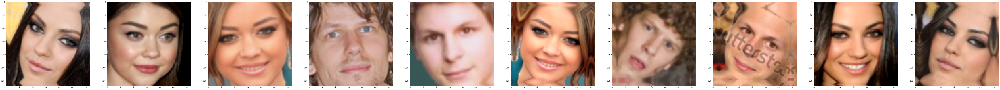


 validation_X:


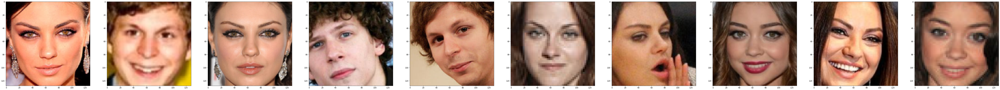


 test_X:


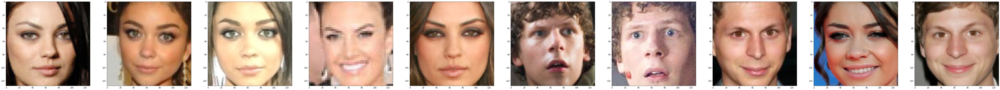

In [86]:
    # D. Overview
    
print("\n--- D. Overview ---\n")

print("\n train_X_augmented:")
plot_image_sequence(train_X_augmented, n=10, imgs_per_row=10)
print("\n validation_X:")
plot_image_sequence(validation_X, n=10, imgs_per_row=10)
print("\n test_X:")
plot_image_sequence(test_X, n=10, imgs_per_row=10)

## 4.1.5. Model

## A. Build

<p>In the following code block the Keras CNN model is build. The different <b>convolution and max pool</b> layers are defined. Those layers differs in the number of filters, but the kernel sizes are kept constant for the respective layer types, namely 3x3 for convolutional layers and 2x2 for max pool layers. All layers use the <b>ReLU activation function</b>, which is the most applied activation function in neural networks. Those convolutional layers are followed by a flattening layer and 2 dense layers. The convolutional part of the model is responsible for recognizing the image features. Those features are thereafter inputted in a traditional <b>multi-layer perceptron (MLP)</b> in order to predict the class of the images. The flatten layers creates the link between both parts. Note that the output layers consists of three nodes, representing the three class labels.</p>

<p>The model is compiled, whereby the 'adam' optimizer is specified. <b>Accuracy</b> is used is as metric.</p>

In [87]:
# 5. Model

print("\n### 5. Model ###\n")

    # A. Build
    
print("\n--- A. Build ---\n")

model = kr.Sequential([
    kr.layers.Conv2D(32, (3,3), activation='relu', input_shape=(128, 128, 3)),
    kr.layers.MaxPool2D((2,2)),
    kr.layers.Conv2D(64, (3,3), activation='relu', input_shape=(128, 128, 3)),
    kr.layers.MaxPool2D((2,2)),
    kr.layers.Conv2D(128, (3,3), activation='relu', input_shape=(128, 128, 3)),
    kr.layers.MaxPool2D((2,2)),
    kr.layers.Conv2D(128, (3,3), activation='relu', input_shape=(128, 128, 3)),
    kr.layers.MaxPool2D((2,2)),
    kr.layers.Flatten(),
    kr.layers.Dense(512, activation='relu'),
    
    # 3 output nodes for three class labels
    kr.layers.Dense(3)
])

model.compile(optimizer="adam", loss=kr.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=["accuracy"])


### 5. Model ###


--- A. Build ---



## B. Fit 

<p>The model is fit using the augmented training data. A limit of 500 epochs is defined, however a <b>early stopping callback</b> with a patience of 10 is defined to overcome overfitting. Thereafter, training accuracy and validation accuracy are plotted.</p>


--- B. Fit ---

Epoch 1/500


2022-04-12 21:42:18.732523: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


13/13 [==============================] - 5s 323ms/step - loss: 14748289597440.0000 - accuracy: 0.3950 - val_loss: 1.0425 - val_accuracy: 0.4500
Epoch 2/500
13/13 [==============================] - 4s 298ms/step - loss: 1.0622 - accuracy: 0.4250 - val_loss: 1.0549 - val_accuracy: 0.4500
Epoch 3/500
13/13 [==============================] - 4s 299ms/step - loss: 1.0443 - accuracy: 0.4250 - val_loss: 0.9649 - val_accuracy: 0.4500
Epoch 4/500
13/13 [==============================] - 4s 303ms/step - loss: 0.9193 - accuracy: 0.5575 - val_loss: 0.8533 - val_accuracy: 0.7000
Epoch 5/500
13/13 [==============================] - 4s 300ms/step - loss: 0.5477 - accuracy: 0.7550 - val_loss: 1.5493 - val_accuracy: 0.7500
Epoch 6/500
13/13 [==============================] - 4s 298ms/step - loss: 0.5371 - accuracy: 0.7650 - val_loss: 0.8544 - val_accuracy: 0.7000
Epoch 7/500
13/13 [==============================] - 4s 303ms/step - loss: 0.2968 - accuracy: 0.8975 - val_loss: 1.1661 - val_accuracy: 0.600

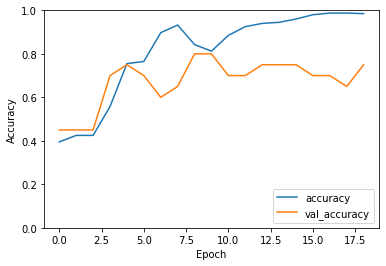

<Figure size 432x288 with 0 Axes>

In [88]:
    # B. Fit
    
print("\n--- B. Fit ---\n")

es_callback = kr.callbacks.EarlyStopping(monitor="val_accuracy", patience=10, restore_best_weights=True)
history = model.fit(train_X_augmented, train_y_augmented, epochs=500, validation_data=(validation_X, validation_y), callbacks=[es_callback])

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')

plt.show()
plt.clf()

## C. Evaluation

<p>A final step consists in <b>evaluating the model</b>. Both the training data and the test data are evaluated, however the results on the test data are more representative as they show how well the model generalize to unseen images.</p>

In [89]:
    # C. Evaluation
    
print("\n--- C. Evaluation ---\n")

train_loss, train_accuracy = model.evaluate(train_X_augmented,  train_y_augmented, verbose=2)
test_loss, test_accuracy = model.evaluate(test_X,  test_y, verbose=2)

print("Training accuracy: " + str(train_accuracy))
print("Test accuracy: " + str(test_accuracy))


--- C. Evaluation ---

13/13 - 1s - loss: 0.5466 - accuracy: 0.7500
1/1 - 0s - loss: 0.7624 - accuracy: 0.6000
Training accuracy: 0.75
Test accuracy: 0.6000000238418579


## 4.1.6. Submission

Finally, the model is used to predict the classes of the submission data.

## A. Prediction

The model outputs logits, hence its is required to take the argmax of the outputted vector in order to get the predicted class.

In [90]:
# 6. Submission

print("\n### 6. Submission ###\n")

    # A. Prediction
    
print("\n--- A. Prediction ---\n")

submission_predictions = model.predict(submission_rescaled)
submission_predictions = submission_predictions.argmax(axis=-1) 


### 6. Submission ###


--- A. Prediction ---



## B. Save

The results are saved to the csv file such that they can be submitted.

<p>This section discussed the implementation of an image classifier using a Keras CNN model. Different conclusions can be drawn. Firstly, the model performs well on <b>training set</b>, whereby the accuracy <b>averages the 100%</b>. Conversely, the validation accuracy varies much, but does not get past the 85%. This means that the model does not generalize well on unseen data. This can also be concluded from the <b>test evaluation</b>, which results in accuracies around the <b>60%/70%</b>. This can be caused by:</p>

<ul>
    <li><b>Limited amount of trainings data</b></li>
    <li><b>Bad data augmentation, caused by unnecessary or wrong-parametrized transformations</b></li>
    <li><b>CNN model is not complex enough or the layers were not defined with the correct parameters</b></li>
    <li><b>Bad choice for other hyperparameters</b></li>
</ul>

To conclude, tuning the hyperparameters as well as adjusting the model parameters could lead to better results. An alternative could be to use the Keras VGG16 model to improve the predictions.

# 5. Publishing best results

In [91]:
    # B. Save
    
print("\n--- B. Save ---\n")

submission = test.copy().drop('img', axis = 1)
submission['class'] = submission_predictions

submission.to_csv('/kaggle/working/submission_keras.csv')


--- B. Save ---



# 6. Discussion


The SIFT feature extractor might give good results for detecting objects with very distinctive shapes and edges, however the results we obtained with the classification of faces were not good enough to use this valuable face classifier.

All of the algorithms used make use of many hyperparameters which need te be tuned for optimal results, there are no magic rules to obtain the best results, for each parameter a set of values needs to be used and verified which works best. 

The HOG feature extractor is more suitable for separating images of faces of different people compared to the SIFT extractor. 

The most popular method for SIFT classification with bag of visual words does not provide good results, despite adapting the parameters to a large range of possible values. 


Possible perfomance improvements:

Augment the training set database with more examples
Combine the used features and classifiers, create ensembles for boosting
